# Analysis for SSFA project: Three factor  model

## Table of contents
1. [Used packages](#imports)
1. [Global settings](#settings)
1. [Load data](#load)
1. [Explore data](#exploration)
1. [Model specification](#model)
1. [Inference](#inference)
   1. [epLsar](#epLsar)
   1. [R²](#r)
   1. [Asfc](#Asfc)
   1. [Smfc](#Smfc)
   1. [HAsfc9](#HAsfc9)
   1. [HAsfc81](#HAsfc81)   
1. [Summary](#summary)

## Used packages <a name="imports"></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import pickle
import arviz as az
import pymc3 as pm

WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [2]:
from matplotlib.colors import to_rgb

In [3]:
import scipy.stats as stats 

In [4]:
from IPython.display import display

In [5]:
import matplotlib as mpl

In [6]:
%load_ext autoreload
%autoreload 2

In [7]:
import plotting_lib

## Global settings <a name="settings"></a>

#### Output

In [8]:
writeOut = True
outPathPlots = "../plots/statistical_model_three_factors/"
outPathData = "../derived_data/statistical_model_three_factors/"

#### Plotting

In [9]:
widthMM = 190 
widthInch = widthMM / 25.4
ratio = 0.66666
heigthInch = ratio*widthInch

SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 12

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
sns.set_style("ticks")

dpi = 300

In [10]:
sizes = [SMALL_SIZE,MEDIUM_SIZE,BIGGER_SIZE]

#### Computing

In [11]:
numSamples = 1000
numCores = 10
numTune = 1000
numPredSamples = 2000
random_seed=36514535
target_accept = 0.99

## Load data <a name="load"></a>

In [12]:
datafile = "../derived_data/preprocessing/preprocessed.dat"

In [13]:
with open(datafile, "rb") as f:
    x1,x2,x3,df,dataZ,dictMeanStd,dictTreatment,dictSoftware = pickle.load(f)    

Show that everything is correct:

In [14]:
display(pd.DataFrame.from_dict({'x1':x1,'x2':x2,'x3':x3}))

,x1,x2,x3
0,0,5,116
1,1,5,116
2,0,5,117
3,1,5,117
4,0,5,118
...,...,...,...
275,1,9,51
276,0,9,52
277,1,9,52
278,0,9,53


x1 indicates the software used, x2 indicates the treatment applied and x3 the sample.

In [15]:
for surfaceParam,(mean,std) in dictMeanStd.items():
    print("Surface parameter {} has mean {} and standard deviation {}".format(surfaceParam,mean,std))

Surface parameter epLsar has mean 0.002866777015225286 and standard deviation 0.0019173233323041528
Surface parameter R² has mean 0.9973197285182144 and standard deviation 0.006745323717352575
Surface parameter Asfc has mean 16.912804592866785 and standard deviation 16.042490777228107
Surface parameter Smfc has mean 2.589874101745179 and standard deviation 10.663178442785044
Surface parameter HAsfc9 has mean 0.31872043020221136 and standard deviation 0.22913790943445264
Surface parameter HAsfc81 has mean 0.5885203613280154 and standard deviation 0.42897734163543366


In [16]:
for k,v in dictTreatment.items():
    print("Number {} encodes treatment {}".format(k,v))

Number 5 encodes treatment Dry bamboo
Number 6 encodes treatment Dry grass
Number 7 encodes treatment Dry lucerne
Number 0 encodes treatment BrushDirt
Number 1 encodes treatment BrushNoDirt
Number 4 encodes treatment Control
Number 10 encodes treatment RubDirt
Number 2 encodes treatment Clover
Number 3 encodes treatment Clover+dust
Number 8 encodes treatment Grass
Number 9 encodes treatment Grass+dust


In [17]:
for k,v in dictSoftware.items():
    print("Number {} encodes software {}".format(k,v))

Number 0 encodes software ConfoMap
Number 1 encodes software Toothfrax


In [18]:
display(dataZ)

,index,TreatmentNumber,SoftwareNumber,DatasetNumber,NameNumber,epLsar_z,R²_z,Asfc_z,Smfc_z,HAsfc9_z,HAsfc81_z
0,0,5,0,0,116,0.896441,0.202280,-0.548753,-0.173680,-0.872185,-0.512580
1,1,5,1,0,116,0.967089,0.332122,-0.410913,-0.231700,-0.799735,-0.528438
2,2,5,0,0,117,1.663582,0.205805,-0.406276,-0.184263,-0.625739,-0.636413
3,3,5,1,0,117,1.559060,0.318335,-0.231484,-0.231700,-0.652395,-0.762985
4,4,5,0,0,118,1.235447,0.140997,-0.524577,-0.187419,-0.425552,-0.460441
...,...,...,...,...,...,...,...,...,...,...,...
275,275,9,1,2,51,0.812186,0.302472,-0.940814,-0.110773,2.259947,1.219611
276,276,9,0,2,52,0.279516,0.134624,-0.883003,-0.199355,1.616592,2.457881
277,277,9,1,2,52,0.141981,0.358659,-0.882314,-0.230373,2.779893,2.898056
278,278,9,0,2,53,-0.859089,0.269132,-0.964638,-0.118959,0.316720,0.540611


In [19]:
display(df)

,Dataset,Name,Software,Diet,Treatment,Before.after,epLsar,R²,Asfc,Smfc,HAsfc9,HAsfc81,NewEplsar,TreatmentNumber,SoftwareNumber,DatasetNumber,NameNumber
0,GuineaPigs,capor_2CC6B1_txP4_#1_1_100xL_1,ConfoMap,Dry bamboo,Dry bamboo,NaN,0.004586,0.998684,8.109445,0.737898,0.118870,0.368635,0.019529,5,0,0,116
1,GuineaPigs,capor_2CC6B1_txP4_#1_1_100xL_1,Toothfrax,Dry bamboo,Dry bamboo,NaN,0.004721,0.999560,10.320730,0.119219,0.135471,0.361833,NaN,5,1,0,116
2,GuineaPigs,capor_2CC6B1_txP4_#1_1_100xL_2,ConfoMap,Dry bamboo,Dry bamboo,NaN,0.006056,0.998708,10.395128,0.625040,0.175340,0.315513,0.020162,5,0,0,117
3,GuineaPigs,capor_2CC6B1_txP4_#1_1_100xL_2,Toothfrax,Dry bamboo,Dry bamboo,NaN,0.005856,0.999467,13.199232,0.119219,0.169232,0.261217,NaN,5,1,0,117
4,GuineaPigs,capor_2CC6B1_txP4_#1_1_100xL_3,ConfoMap,Dry bamboo,Dry bamboo,NaN,0.005236,0.998271,8.497286,0.591396,0.221210,0.391002,0.019804,5,0,0,118
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
275,Sheeps,L8-Ovis-90730-lm2sin-a,Toothfrax,Grass+dust,Grass+dust,NaN,0.004424,0.999360,1.819802,1.408678,0.836560,1.111706,NaN,9,1,2,51
276,Sheeps,L8-Ovis-90764-lm2sin-a,ConfoMap,Grass+dust,Grass+dust,NaN,0.003403,0.998228,2.747241,0.464115,0.689143,1.642896,0.018978,9,0,2,52
277,Sheeps,L8-Ovis-90764-lm2sin-a,Toothfrax,Grass+dust,Grass+dust,NaN,0.003139,0.999739,2.758297,0.133366,0.955699,1.831721,NaN,9,1,2,52
278,Sheeps,L8-Ovis-90814-lm2sin-a,ConfoMap,Grass+dust,Grass+dust,NaN,0.001220,0.999135,1.437607,1.321398,0.391293,0.820430,0.017498,9,0,2,53


#### Contrasts
Prepare dicts for contrasts that are of interest later.

In [20]:
x1contrast_dict = {'{}_{}'.format(dictSoftware[0],dictSoftware[1]):[1,-1]}
x1contrast_dict

{'ConfoMap_Toothfrax': [1, -1]}

## Explore data <a name="exploration"></a>

#### Compute raw differences

In [21]:
dfRawDiff = dataZ.groupby(['DatasetNumber','TreatmentNumber','NameNumber']).agg(list).applymap(lambda l : l[0]-l[1]).reset_index()

In [22]:
dfRawDiff

,DatasetNumber,TreatmentNumber,NameNumber,index,SoftwareNumber,epLsar_z,R²_z,Asfc_z,Smfc_z,HAsfc9_z,HAsfc81_z
0,0,5,116,-1,-1,-0.070648,-0.129842,-0.137839,0.058020,-0.072450,0.015858
1,0,5,117,-1,-1,0.104522,-0.112529,-0.174792,0.047436,0.026656,0.126571
2,0,5,118,-1,-1,0.239671,-0.147984,-0.159759,0.044281,0.016639,0.080289
3,0,5,119,-1,-1,0.476779,-0.302235,-0.168608,0.050771,0.103129,-0.109117
4,0,5,120,-1,-1,0.236874,-0.167349,-0.211669,0.038471,0.204357,0.131015
...,...,...,...,...,...,...,...,...,...,...,...
135,2,9,49,-1,-1,0.571277,-0.343614,0.106248,-0.005013,0.221809,0.418985
136,2,9,50,-1,-1,1.712439,-0.337458,0.006518,0.013172,1.765524,0.968364
137,2,9,51,-1,-1,-2.132379,-0.403501,-0.002979,0.273535,-0.015592,0.324495
138,2,9,52,-1,-1,0.137536,-0.224035,-0.000689,0.031018,-1.163301,-0.440175


#### Show difference between software in raw data

In [23]:
variablesList = ['epLsar','R²','Asfc','Smfc','HAsfc9','HAsfc81']

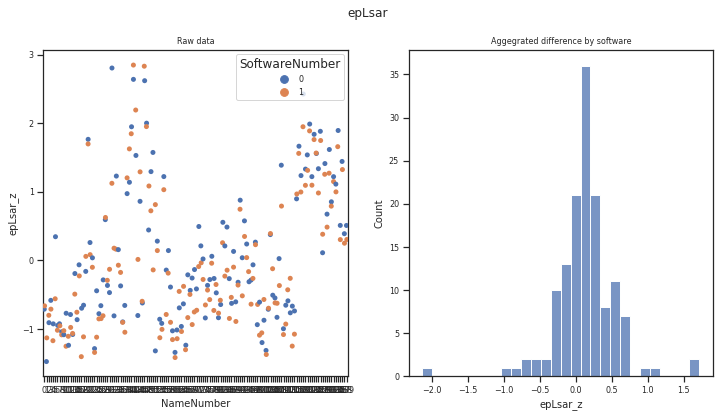

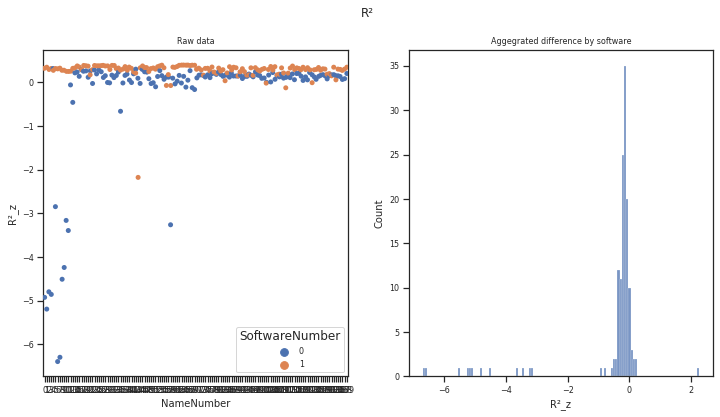

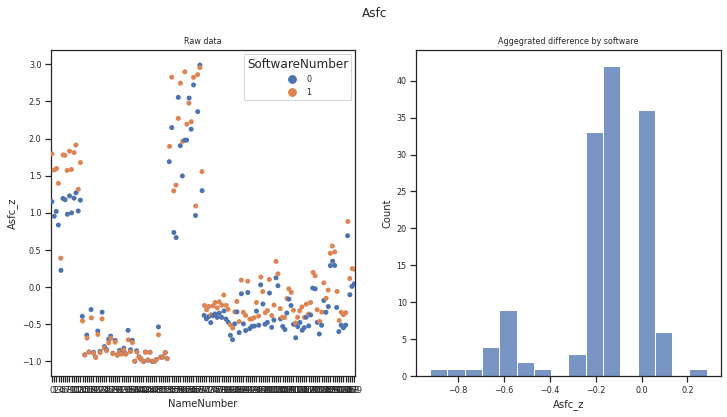

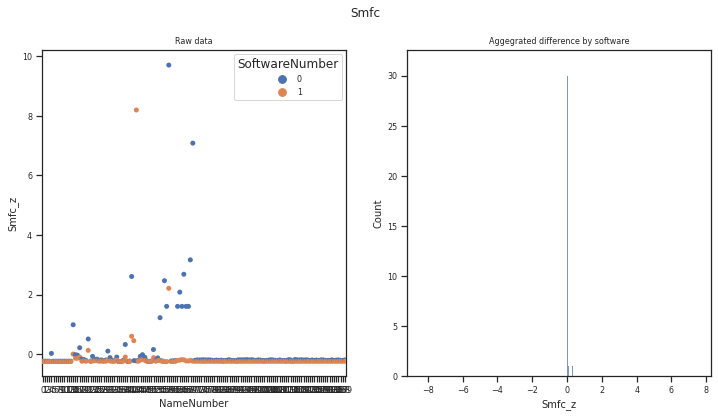

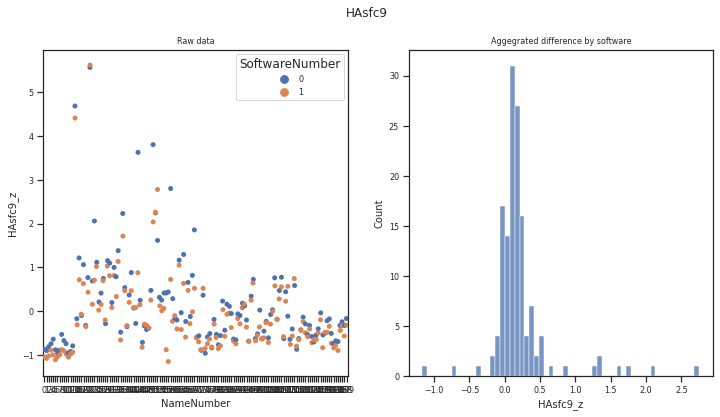

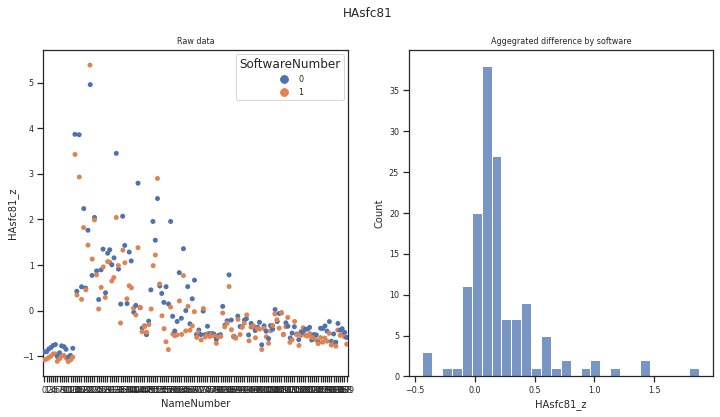

In [24]:
for var in variablesList:
    fig, axes = plt.subplots(1, 2,figsize=(12,6))
    fig.suptitle('{}'.format(var))

    
    sns.stripplot(data=dataZ,x='NameNumber',y='{}_z'.format(var),hue='SoftwareNumber',ax=axes[0]);
    axes[0].set_title('Raw data')

    sns.histplot(data=dfRawDiff,x='{}_z'.format(var),ax=axes[1]);
    axes[1].set_title('Aggegrated difference by software'.format(var))

    plt.show()

## Model specification <a name="model"></a>

In [25]:
class ThreeFactorModel(pm.Model):
    
    """
    Compute params of priors and hyperpriors.
    """
    def getParams(self,x1,x2,x3,y):
        # get lengths
        Nx1Lvl = np.unique(x1).size
        Nx2Lvl = np.unique(x2).size
        Nx3Lvl = np.unique(x3).size        
        
        dims = (Nx1Lvl, Nx2Lvl, Nx3Lvl)
        
        ### get standard deviations
        
        # convert to pandas dataframe to use their logic
        df = pd.DataFrame.from_dict({'x1':x1,'x2':x2,'x3':x3,'y':y})
        
        s1 = df.groupby('x1').std()['y'].max()
        s2 = df.groupby('x2').std()['y'].max()
        s3 = df.groupby('x3').std()['y'].max()
        
        stdSingle = (s1, s2, s3)
        
        return (dims, stdSingle)
    
    def printParams(self,x1,x2,x3,y):
        dims, stdSingle = self.getParams(x1,x2,x3,y)
        Nx1Lvl, Nx2Lvl, Nx3Lvl = dims
        s1, s2, s3 = stdSingle        
        
        print("The number of levels of the x variables are {}".format(dims))
        print("The standard deviations used for the beta priors are {}".format(stdSingle))
            
    def __init__(self,name,x1,x2,x3,y,model=None):
        
        # call super's init first, passing model and name
        super().__init__(name, model)
        
        # get parameter of hyperpriors
        dims, stdSingle = self.getParams(x1,x2,x3,y)
        Nx1Lvl, Nx2Lvl, Nx3Lvl = dims
        s1, s2, s3 = stdSingle        
        
        ### hyperpriors ### 
        # observation hyperpriors
        lamY = 1/30.
        muGamma = 0.5
        sigmaGamma = 2.
        
        # prediction hyperpriors
        sigma0 = pm.HalfNormal('sigma0',sd=1)
        sigma1 = pm.HalfNormal('sigma1',sd=s1, shape=Nx1Lvl)
        sigma2 = pm.HalfNormal('sigma2',sd=s2, shape=Nx2Lvl)
        sigma3 = pm.HalfNormal('sigma3',sd=s3, shape=Nx3Lvl)
                
        mu_b0 = pm.Normal('mu_b0', mu=0., sd=1)
        mu_b1 = pm.Normal('mu_b1', mu=0., sd=1, shape=Nx1Lvl)
        mu_b2 = pm.Normal('mu_b2', mu=0., sd=1, shape=Nx2Lvl)
        mu_b3 = pm.Normal('mu_b3', mu=0., sd=1, shape=Nx3Lvl)       
                                       
        ### priors ### 
        # observation priors        
        nuY = pm.Exponential('nuY',lam=lamY)
        sigmaY = pm.Gamma('sigmaY',mu=muGamma, sigma=sigmaGamma)
        
        # prediction priors
        b0_dist = pm.Normal('b0_dist', mu=0, sd=1)
        b0 = pm.Deterministic("b0", mu_b0 + b0_dist * sigma0)
       
        b1_dist = pm.Normal('b1_dist', mu=0, sd=1)
        b1 = pm.Deterministic("b1", mu_b1 + b1_dist * sigma1)
        
        b2_dist = pm.Normal('b2_dist', mu=0, sd=1)
        b2 = pm.Deterministic("b2", mu_b2 + b2_dist * sigma2)
        
        b3_dist = pm.Normal('b3_dist', mu=0, sd=1)
        b3 = pm.Deterministic("b3", mu_b3 + b3_dist * sigma3)
             
        #### prediction ###      
        mu = pm.Deterministic('mu',b0 + b1[x1] + b2[x2] +  b3[x3])

                                
        ### observation ### 
        y = pm.StudentT('y',nu = nuY, mu=mu, sd=sigmaY, observed=y)

## Inference <a name="inference"></a>

### epLsar <a name="epLsar"></a>

In [26]:
with pm.Model() as model:
    epLsarModel = ThreeFactorModel('epLsar',x1,x2,x3,dataZ.epLsar_z.values)

#### Verify model settings

In [27]:
epLsarModel.printParams(x1,x2,x3,dataZ.epLsar_z.values)

The number of levels of the x variables are (2, 11, 140)
The standard deviations used for the beta priors are (1.0100483277420549, 1.278487256789849, 1.5078196766225158)


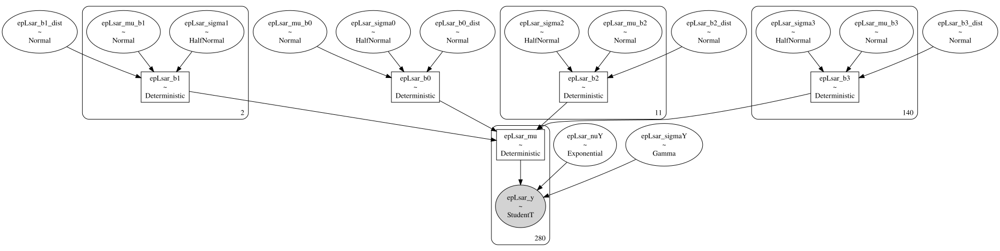

In [28]:
try:
    graph_epLsar = pm.model_to_graphviz(epLsarModel)    
except:
    graph_epLsar = "Could not make graph"
graph_epLsar

#### Check prior choice

In [29]:
with epLsarModel as model:
    prior_pred_epLsar = pm.sample_prior_predictive(samples=numPredSamples,random_seed=random_seed)

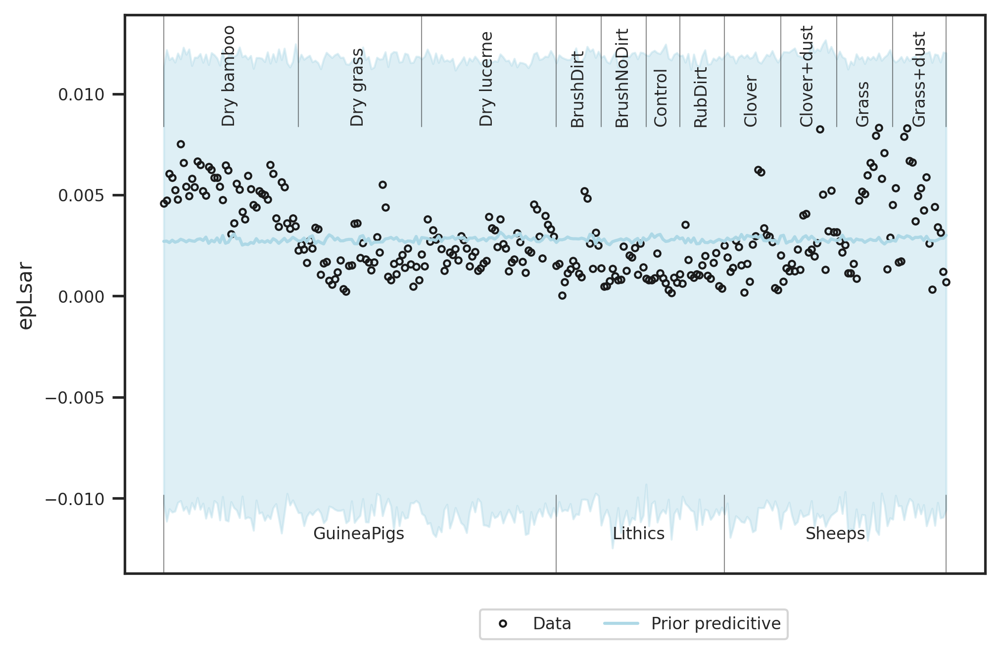

In [30]:
plotting_lib.plotPriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,dictMeanStd,prior_pred_epLsar,dataZ.epLsar_z.values,'epLsar')

Prior choice is as intended: Broad over the data range.

#### Sampling

In [31]:
with epLsarModel as model:
    trace_epLsar = pm.sample(numSamples,cores=numCores,tune=numTune,max_treedepth=20, init='auto',target_accept=target_accept,random_seed=random_seed)
    #fit_epLsar = pm.fit(random_seed=random_seed)
    #trace_epLsar = fit_epLsar.sample(draws=numSamples)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 10 jobs)
NUTS: [epLsar_b3_dist, epLsar_b2_dist, epLsar_b1_dist, epLsar_b0_dist, epLsar_sigmaY, epLsar_nuY, epLsar_mu_b3, epLsar_mu_b2, epLsar_mu_b1, epLsar_mu_b0, epLsar_sigma3, epLsar_sigma2, epLsar_sigma1, epLsar_sigma0]


Sampling 10 chains for 1_000 tune and 1_000 draw iterations (10_000 + 10_000 draws total) took 1266 seconds.
The number of effective samples is smaller than 10% for some parameters.


In [32]:
with epLsarModel as model:
    if writeOut:
        with open(outPathData + 'model_{}.pkl'.format('epLsar'), 'wb') as buff:
            pickle.dump({'model':epLsarModel, 'trace': trace_epLsar}, buff)

#### Check sampling

In [33]:
with epLsarModel as model:
    dataTrace_epLsar = az.from_pymc3(trace=trace_epLsar)

In [34]:
pm.summary(dataTrace_epLsar,hdi_prob=0.95).round(2)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
epLsar_mu_b0,-0.04,0.80,-1.57,1.59,0.01,0.01,7622.0,5554.0,7613.0,7245.0,1.00
epLsar_mu_b1[0],0.03,0.69,-1.28,1.48,0.01,0.01,7462.0,4854.0,7449.0,6737.0,1.00
epLsar_mu_b1[1],-0.07,0.69,-1.41,1.29,0.01,0.01,7114.0,4883.0,7145.0,6557.0,1.00
epLsar_mu_b2[0],-0.28,0.52,-1.28,0.73,0.01,0.00,4471.0,4471.0,4424.0,5675.0,1.00
epLsar_mu_b2[1],-0.52,0.52,-1.50,0.51,0.01,0.01,3907.0,3907.0,3877.0,5589.0,1.00
...,...,...,...,...,...,...,...,...,...,...,...
epLsar_mu[275],0.44,0.72,-1.47,1.11,0.02,0.02,848.0,848.0,1775.0,1849.0,1.01
epLsar_mu[276],0.28,0.11,0.06,0.52,0.00,0.00,10579.0,9610.0,10492.0,8014.0,1.00
epLsar_mu[277],0.15,0.11,-0.08,0.39,0.00,0.00,10684.0,8439.0,10561.0,7691.0,1.00
epLsar_mu[278],-0.91,0.13,-1.16,-0.64,0.00,0.00,10847.0,10847.0,10995.0,7407.0,1.00


/home/bob/.local/lib/python3.8/site-packages/arviz/plots/backends/matplotlib/pairplot.py:212: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  warnings.warn(


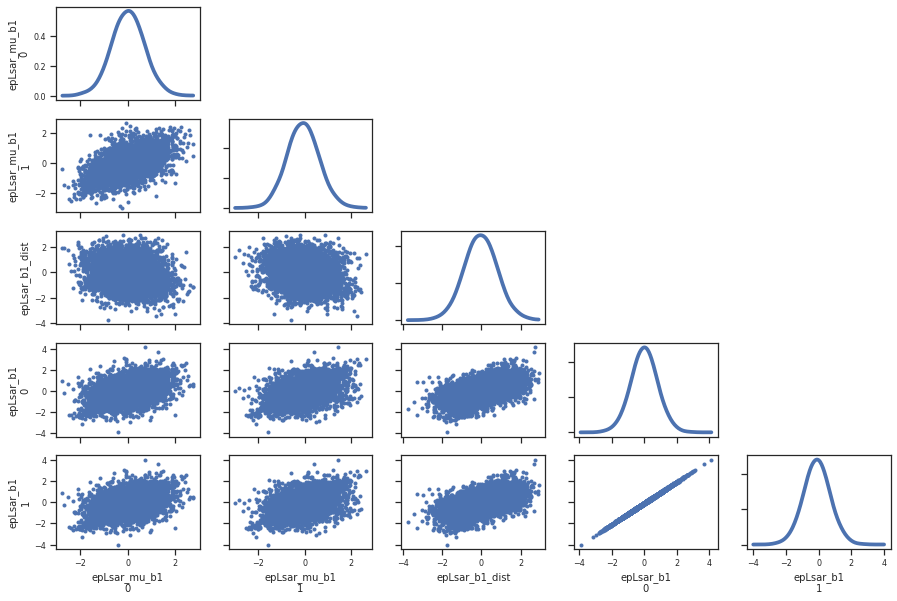

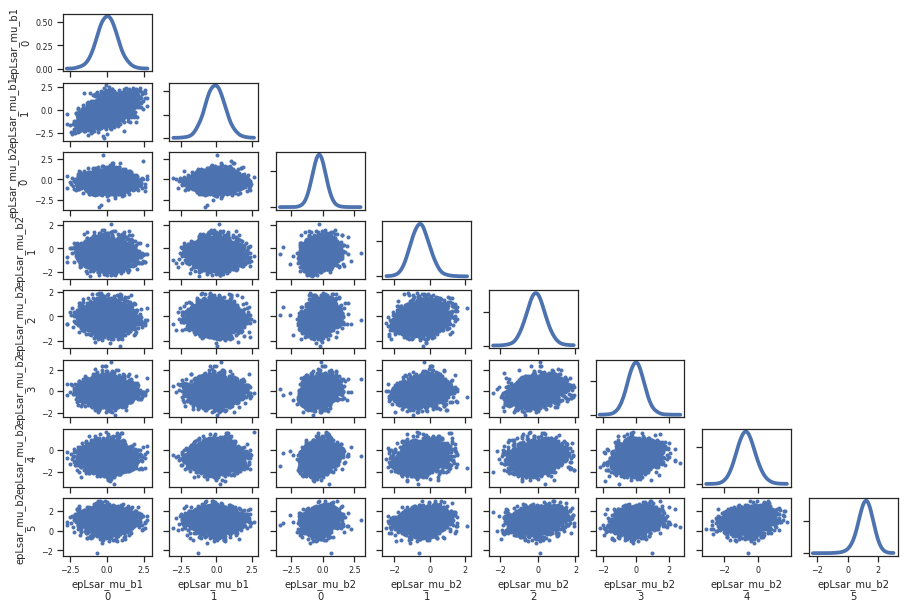

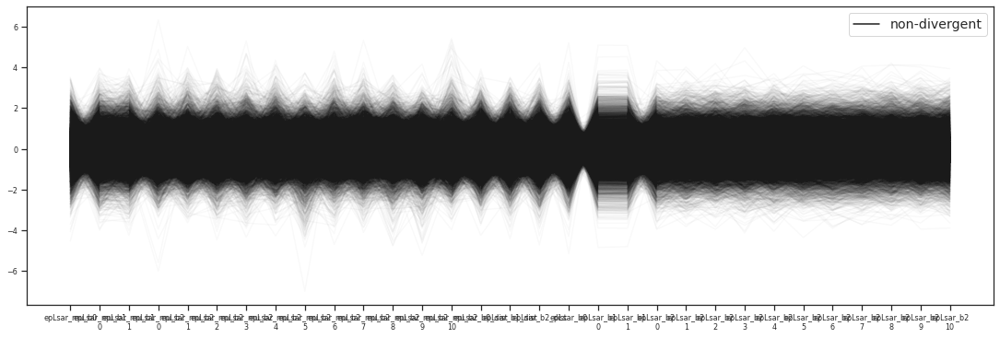

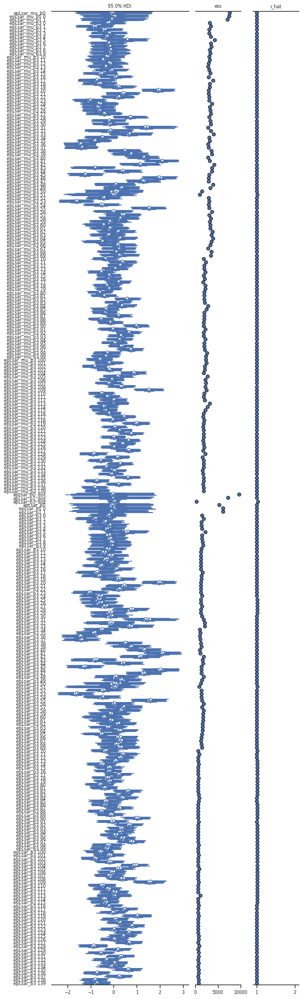

In [35]:
plotting_lib.plotDiagnostics(widthInch,heigthInch,dpi,writeOut,outPathPlots,trace_epLsar,dataTrace_epLsar,'epLsar')

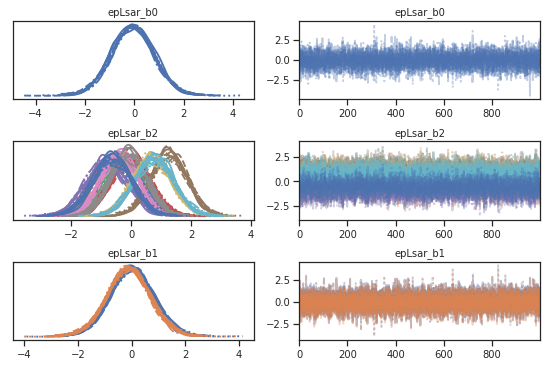

In [36]:
with epLsarModel as model:
    plotting_lib.plotTracesB(widthInch,heigthInch,dpi,writeOut,outPathPlots,trace_epLsar,'epLsar')

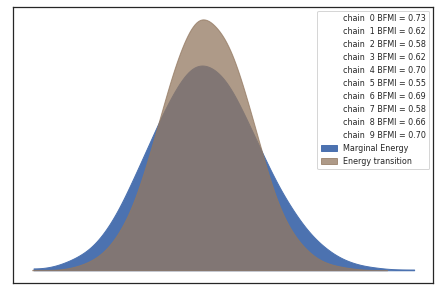

In [37]:
with epLsarModel as model:
    plotting_lib.pm.energyplot(trace_epLsar)

#### Posterior predictive distribution

In [38]:
with epLsarModel as model:
    posterior_pred_epLsar = pm.sample_posterior_predictive(trace_epLsar,samples=numPredSamples,random_seed=random_seed)

/home/bob/.local/lib/python3.8/site-packages/pymc3/sampling.py:1707: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


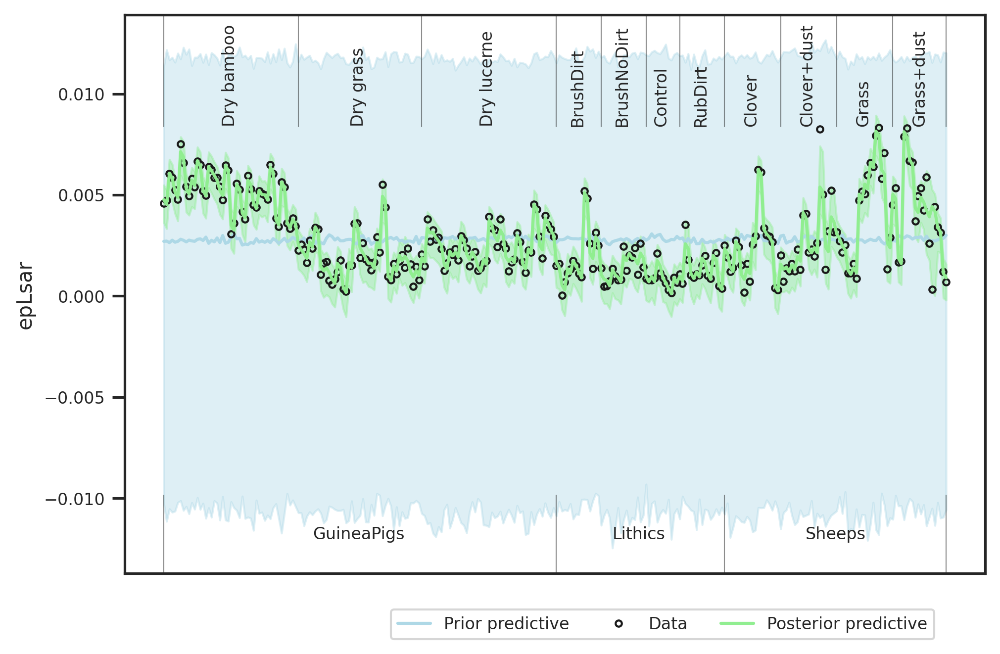

In [39]:
plotting_lib.plotPriorPosteriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,dictMeanStd,prior_pred_epLsar,posterior_pred_epLsar,dataZ.epLsar_z.values,'epLsar')

#### Compare prior and posterior for model parameters

In [40]:
with epLsarModel as model:
    pm_data_epLsar = az.from_pymc3(trace=trace_epLsar,prior=prior_pred_epLsar,posterior_predictive=posterior_pred_epLsar)

arviz.data.io_pymc3 - WARNING - posterior predictive variable epLsar_y's shape not compatible with number of chains and draws. This can mean that some draws or even whole chains are not represented.


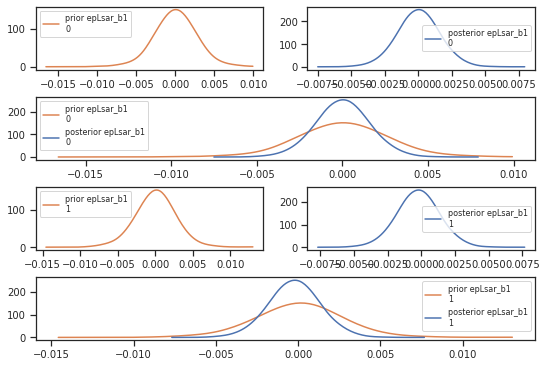

In [41]:
plotting_lib.plotPriorPosteriorB(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,pm_data_epLsar,'epLsar')

#### Posterior and contrasts

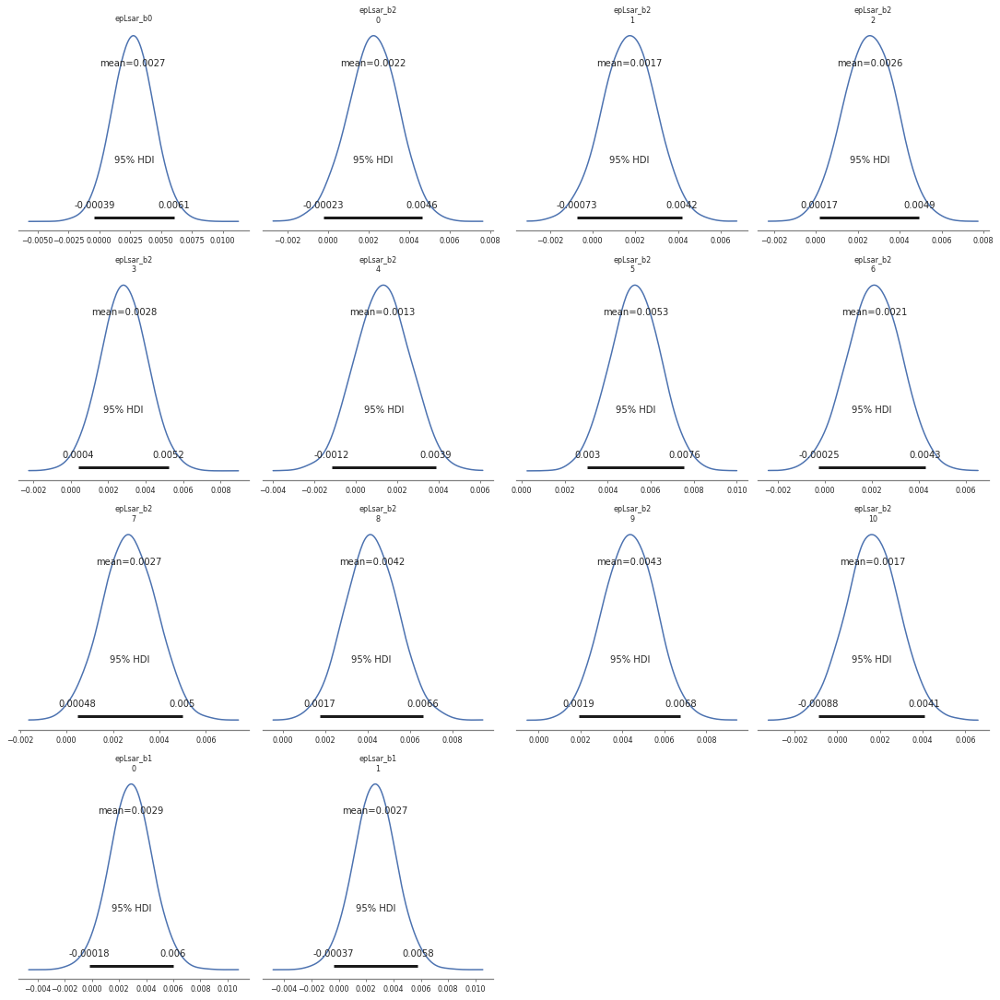

In [42]:
plotting_lib.plotPosterior(widthInch,heigthInch,dpi,writeOut,outPathPlots,dictMeanStd,pm_data_epLsar,'epLsar')

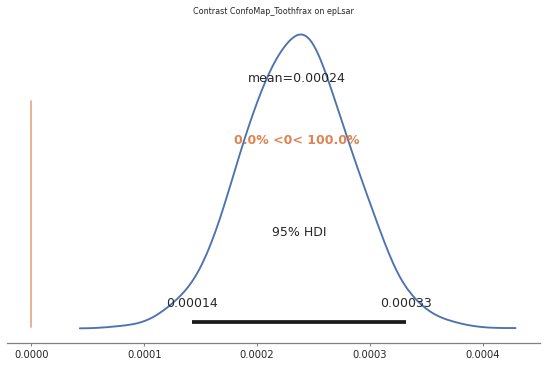

In [43]:
plotting_lib.plotContrast(widthInch,heigthInch,dpi,writeOut,outPathPlots,dictMeanStd,x1contrast_dict,trace_epLsar,'epLsar')

### R²<a name="r"></a>

In [44]:
with pm.Model() as model:
    RsquaredModel = ThreeFactorModel('R²',x1,x2,x3,dataZ["R²_z"].values)

#### Verify model settings

In [45]:
RsquaredModel.printParams(x1,x2,x3,dataZ["R²_z"].values)

The number of levels of the x variables are (2, 11, 140)
The standard deviations used for the beta priors are (1.3433087377122408, 2.3171005331515255, 4.743899942874919)


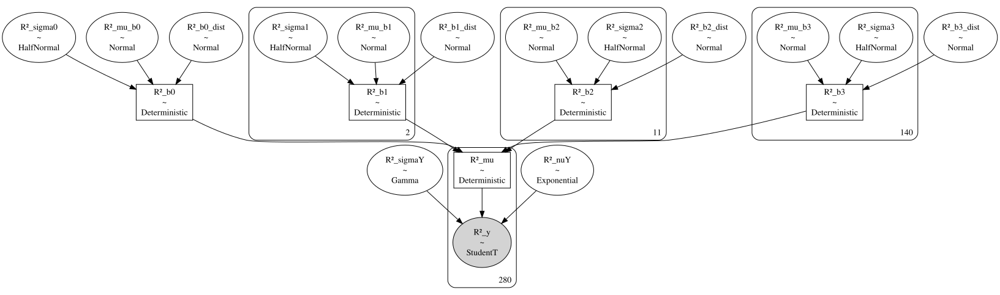

In [46]:
pm.model_to_graphviz(RsquaredModel)

#### Check prior choice

In [47]:
with RsquaredModel as model:
    prior_pred_Rsquared = pm.sample_prior_predictive(samples=numPredSamples,random_seed=random_seed)

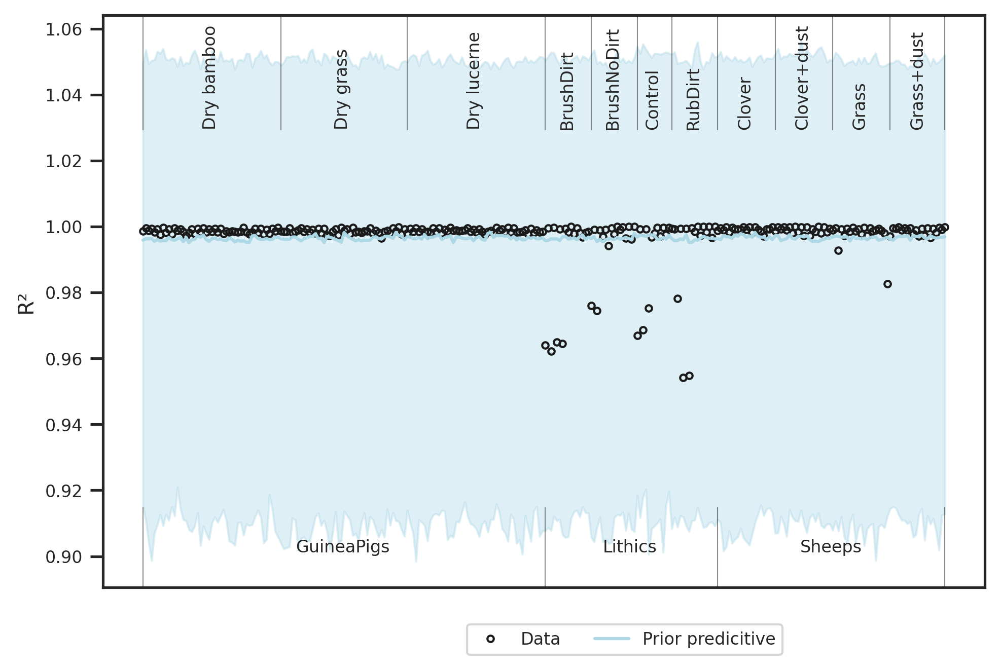

In [48]:
plotting_lib.plotPriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,dictMeanStd,prior_pred_Rsquared,dataZ["R²_z"].values,'R²')

#### Sampling

In [49]:
with RsquaredModel as model:
    trace_Rsquared = pm.sample(numSamples,cores=numCores,tune=numTune,max_treedepth=20, init='auto',target_accept=target_accept,random_seed=random_seed)
    #fit_Rsquared = pm.fit(random_seed=random_seed)
    #trace_Rsquared = fit_Rsquared.sample(draws=numSamples)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 10 jobs)
NUTS: [R²_b3_dist, R²_b2_dist, R²_b1_dist, R²_b0_dist, R²_sigmaY, R²_nuY, R²_mu_b3, R²_mu_b2, R²_mu_b1, R²_mu_b0, R²_sigma3, R²_sigma2, R²_sigma1, R²_sigma0]


Sampling 10 chains for 1_000 tune and 1_000 draw iterations (10_000 + 10_000 draws total) took 4073 seconds.
The number of effective samples is smaller than 10% for some parameters.


In [50]:
with RsquaredModel as model:
    if writeOut:
        with open(outPathData + 'model_{}.pkl'.format('R²'), 'wb') as buff:
            pickle.dump({'model': RsquaredModel, 'trace': trace_Rsquared}, buff)

#### Check sampling

In [51]:
with RsquaredModel as model:
    dataTrace_Rsquared = az.from_pymc3(trace=trace_Rsquared)

In [52]:
pm.summary(dataTrace_Rsquared,hdi_prob=0.95).round(2)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
R²_mu_b0,0.08,0.81,-1.48,1.69,0.01,0.01,6762.0,6163.0,6757.0,7576.0,1.0
R²_mu_b1[0],-0.02,0.70,-1.42,1.30,0.01,0.01,6681.0,6320.0,6682.0,7535.0,1.0
R²_mu_b1[1],0.10,0.70,-1.27,1.48,0.01,0.01,6703.0,6116.0,6708.0,7195.0,1.0
R²_mu_b2[0],-0.02,0.51,-0.99,0.99,0.01,0.01,2647.0,2647.0,2635.0,5175.0,1.0
R²_mu_b2[1],-0.06,0.50,-1.02,0.94,0.01,0.01,2857.0,2857.0,2841.0,5241.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
R²_mu[275],0.18,0.13,-0.03,0.40,0.00,0.00,5636.0,4146.0,6347.0,7580.0,1.0
R²_mu[276],0.17,0.06,0.06,0.27,0.00,0.00,9507.0,6626.0,9754.0,6729.0,1.0
R²_mu[277],0.32,0.06,0.23,0.43,0.00,0.00,9769.0,8101.0,9835.0,6548.0,1.0
R²_mu[278],0.25,0.05,0.15,0.33,0.00,0.00,10851.0,5275.0,9471.0,6342.0,1.0


/home/bob/.local/lib/python3.8/site-packages/arviz/data/io_pymc3.py:85: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(
/home/bob/.local/lib/python3.8/site-packages/arviz/data/io_pymc3.py:85: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(
/home/bob/.local/lib/python3.8/site-packages/arviz/plots/backends/matplotlib/pairplot.py:212: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  warnings.warn(
/home/bob/.local/lib/python3.8/site-packages/arviz/data/io_pymc3.py:85: Futur

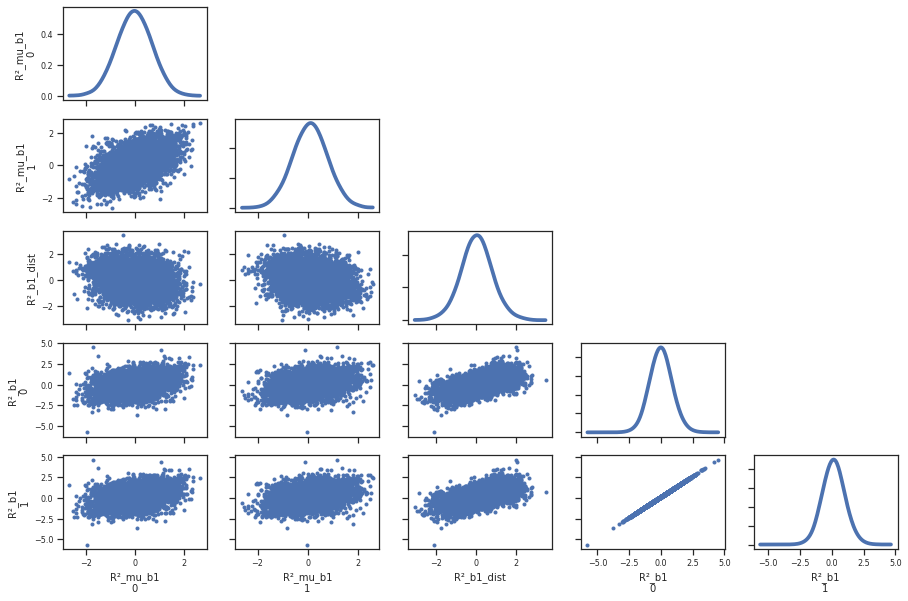

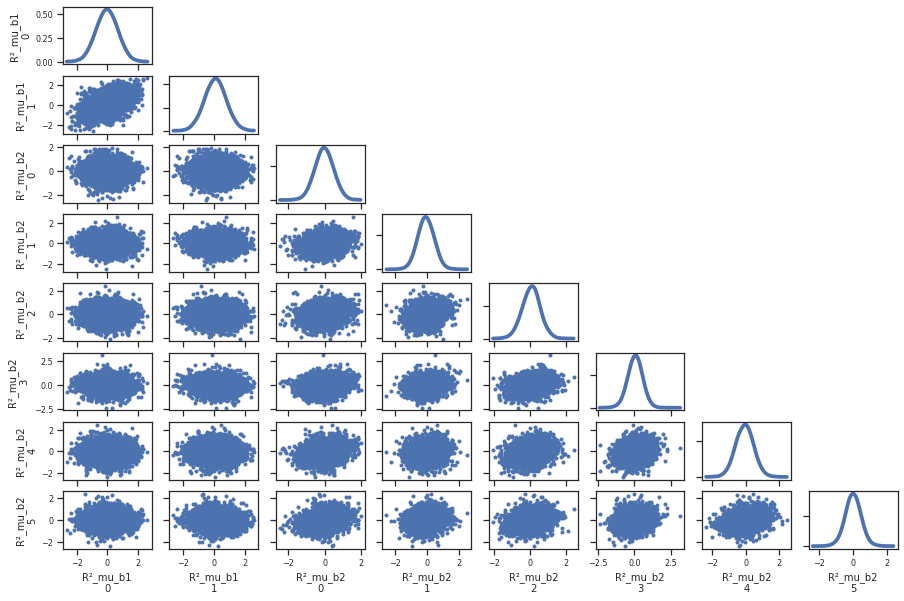

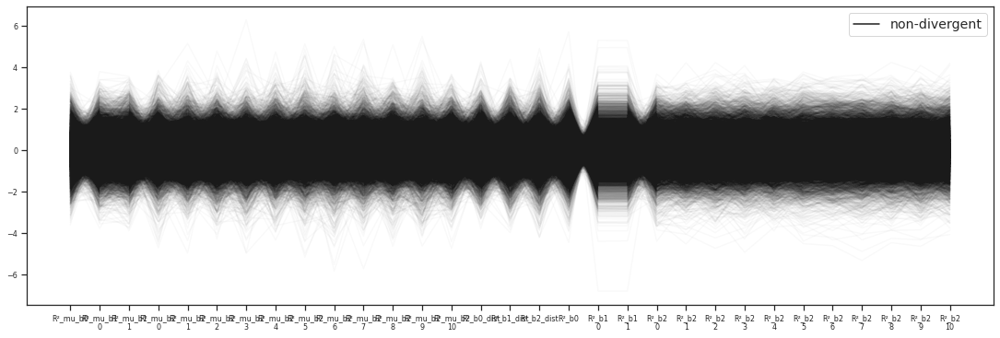

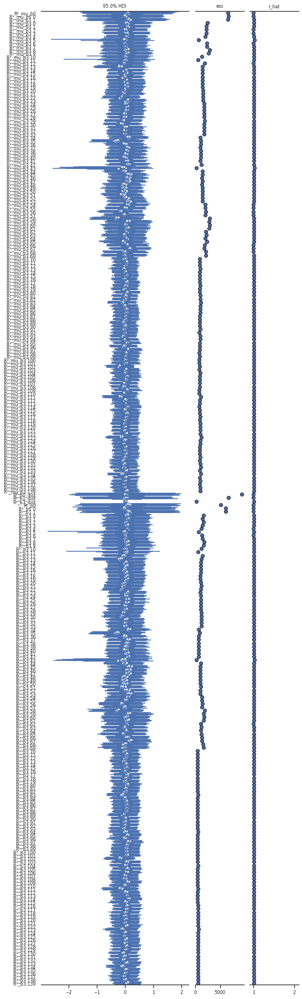

In [53]:
plotting_lib.plotDiagnostics(widthInch,heigthInch,dpi,writeOut,outPathPlots,dataTrace_Rsquared,trace_Rsquared,'R²')

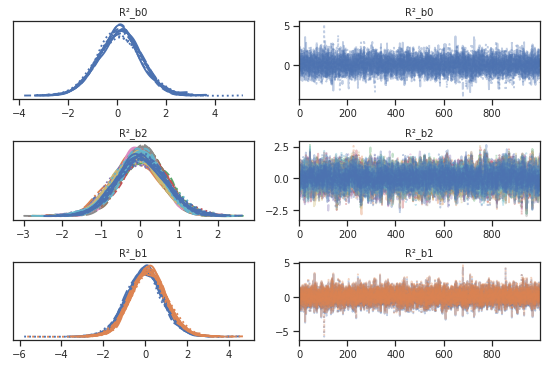

In [54]:
with RsquaredModel as model:
    plotting_lib.plotTracesB(widthInch,heigthInch,dpi,writeOut,outPathPlots,trace_Rsquared,'R²')

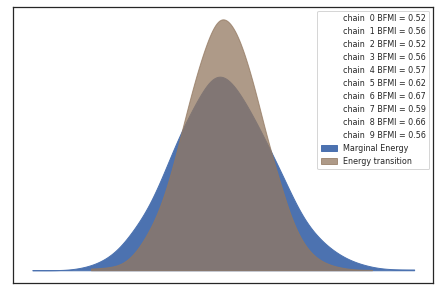

In [55]:
with RsquaredModel as model:
    plotting_lib.pm.energyplot(trace_Rsquared)

#### Posterior predictive distribution

In [56]:
with RsquaredModel as model:
    posterior_pred_Rsquared = pm.sample_posterior_predictive(trace_Rsquared,samples=numPredSamples,random_seed=random_seed)

/home/bob/.local/lib/python3.8/site-packages/pymc3/sampling.py:1707: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


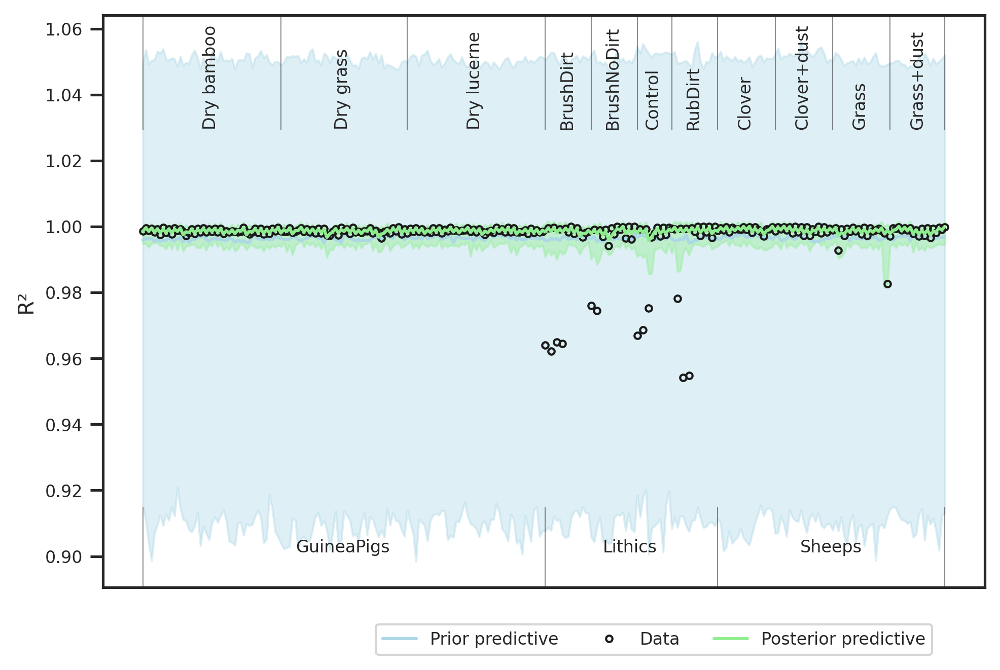

In [57]:
plotting_lib.plotPriorPosteriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,dictMeanStd,prior_pred_Rsquared,posterior_pred_Rsquared,dataZ["R²_z"].values,'R²')

#### Compare prior and posterior for model parameters

In [58]:
with RsquaredModel as model:
    pm_data_Rsquared = az.from_pymc3(trace=trace_Rsquared,prior=prior_pred_Rsquared,posterior_predictive=posterior_pred_Rsquared)

arviz.data.io_pymc3 - WARNING - posterior predictive variable R²_y's shape not compatible with number of chains and draws. This can mean that some draws or even whole chains are not represented.


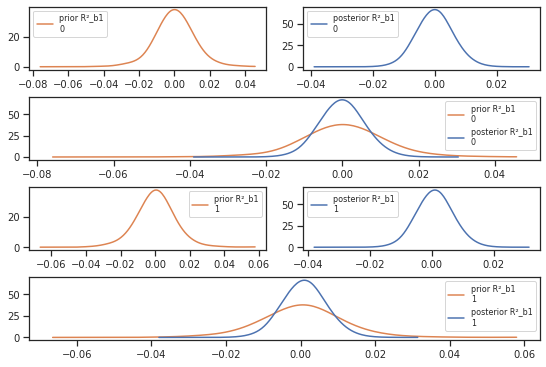

In [59]:
plotting_lib.plotPriorPosteriorB(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,pm_data_Rsquared,'R²')

#### Posterior and contrasts

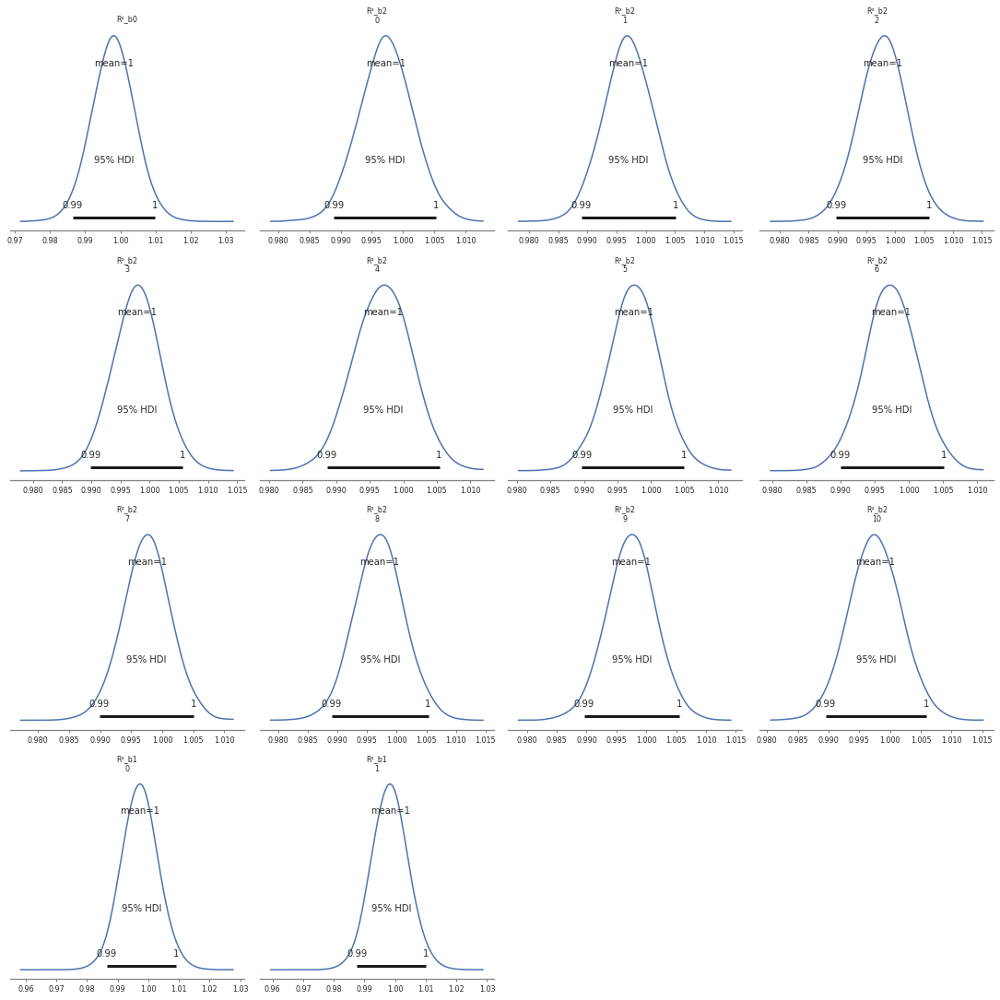

In [60]:
plotting_lib.plotPosterior(widthInch,heigthInch,dpi,writeOut,outPathPlots,dictMeanStd,pm_data_Rsquared,'R²')

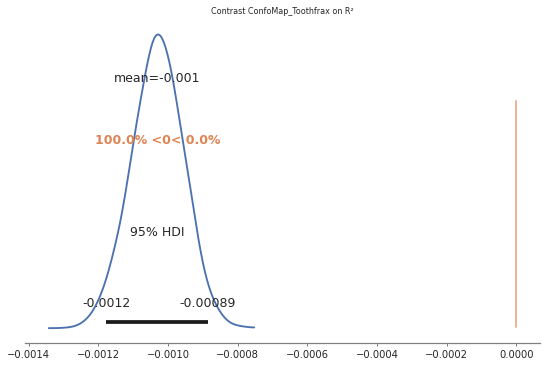

In [61]:
plotting_lib.plotContrast(widthInch,heigthInch,dpi,writeOut,outPathPlots,dictMeanStd,x1contrast_dict,trace_Rsquared,'R²')

### Asfc  <a name="Asfc"></a>

In [62]:
with pm.Model() as model:
    AsfcModel = ThreeFactorModel('Asfc',x1,x2,x3,dataZ["Asfc_z"].values)

#### Verify model settings

In [63]:
AsfcModel.printParams(x1,x2,x3,dataZ["Asfc_z"].values)

The number of levels of the x variables are (2, 11, 140)
The standard deviations used for the beta priors are (1.0620939450667206, 0.7885965314025212, 0.651156614448482)


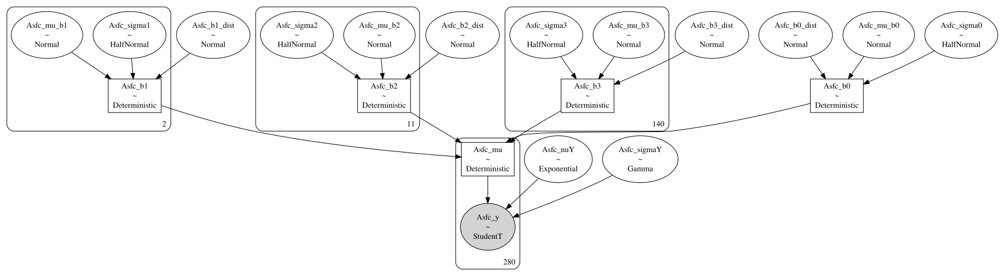

In [64]:
pm.model_to_graphviz(AsfcModel)

#### Check prior choice

In [65]:
with AsfcModel as model:
    prior_pred_Asfc = pm.sample_prior_predictive(samples=numPredSamples,random_seed=random_seed)

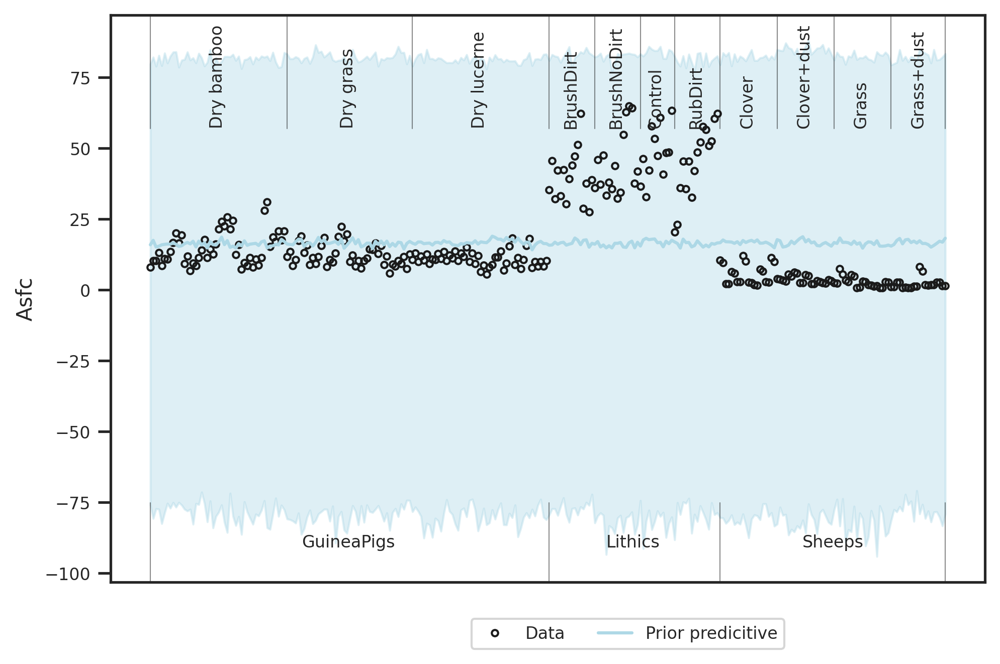

In [66]:
plotting_lib.plotPriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,dictMeanStd,prior_pred_Asfc,dataZ["Asfc_z"].values,'Asfc')

Prior choice is as intended: Broad over the data range.

#### Sampling

In [67]:
with AsfcModel as model:
    trace_Asfc = pm.sample(numSamples,cores=numCores,tune=numTune,max_treedepth=20, init='auto',target_accept=target_accept,random_seed=random_seed)
    #fit_Asfc = pm.fit(random_seed=random_seed)
    #trace_Asfc = fit_Asfc.sample(draws=numSamples)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 10 jobs)
NUTS: [Asfc_b3_dist, Asfc_b2_dist, Asfc_b1_dist, Asfc_b0_dist, Asfc_sigmaY, Asfc_nuY, Asfc_mu_b3, Asfc_mu_b2, Asfc_mu_b1, Asfc_mu_b0, Asfc_sigma3, Asfc_sigma2, Asfc_sigma1, Asfc_sigma0]


Sampling 10 chains for 1_000 tune and 1_000 draw iterations (10_000 + 10_000 draws total) took 2767 seconds.
The number of effective samples is smaller than 10% for some parameters.


In [68]:
with AsfcModel as model:
    if writeOut:
        with open(outPathData + 'model_{}.pkl'.format('Asfc'), 'wb') as buff:
            pickle.dump({'model': AsfcModel, 'trace': trace_Asfc}, buff)

#### Check sampling

In [69]:
with AsfcModel as model:
    dataTrace_Asfc = az.from_pymc3(trace=trace_Asfc)

In [70]:
pm.summary(dataTrace_Asfc,hdi_prob=0.95).round(2)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
Asfc_mu_b0,0.06,0.83,-1.59,1.65,0.01,0.01,8891.0,5324.0,8899.0,7339.0,1.0
Asfc_mu_b1[0],-0.03,0.70,-1.45,1.29,0.01,0.01,8832.0,6211.0,8820.0,8127.0,1.0
Asfc_mu_b1[1],0.10,0.71,-1.26,1.50,0.01,0.01,8935.0,6109.0,8938.0,7797.0,1.0
Asfc_mu_b2[0],0.94,0.55,-0.17,1.98,0.01,0.00,5261.0,5261.0,5234.0,6534.0,1.0
Asfc_mu_b2[1],1.17,0.56,0.08,2.29,0.01,0.01,4678.0,4678.0,4685.0,6474.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
Asfc_mu[275],-0.88,0.07,-1.01,-0.74,0.00,0.00,10206.0,9471.0,9696.0,7353.0,1.0
Asfc_mu[276],-0.95,0.07,-1.09,-0.81,0.00,0.00,9236.0,9236.0,9372.0,7709.0,1.0
Asfc_mu[277],-0.82,0.07,-0.95,-0.67,0.00,0.00,9314.0,9314.0,9458.0,7407.0,1.0
Asfc_mu[278],-1.03,0.07,-1.17,-0.90,0.00,0.00,10064.0,10064.0,10103.0,7744.0,1.0


/home/bob/.local/lib/python3.8/site-packages/arviz/plots/backends/matplotlib/pairplot.py:212: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  warnings.warn(


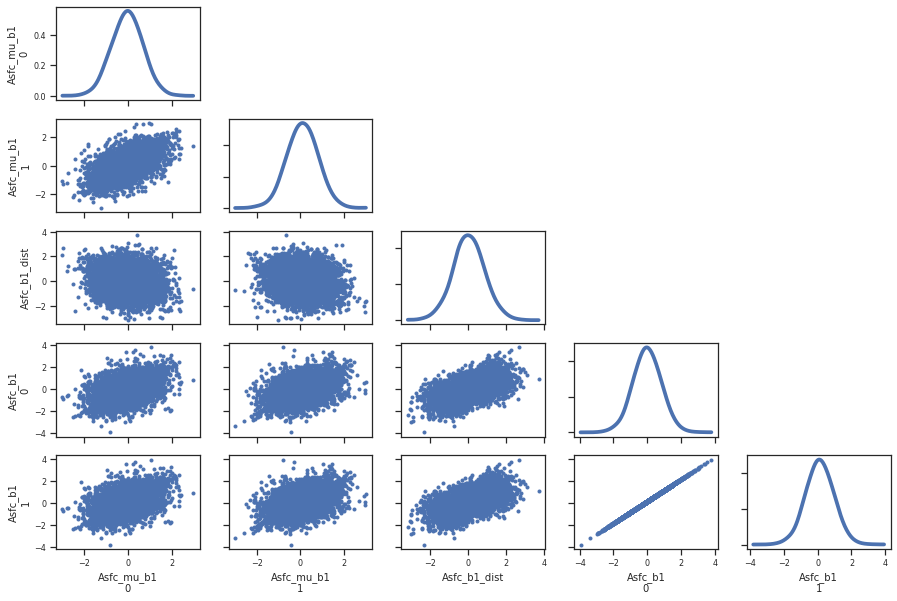

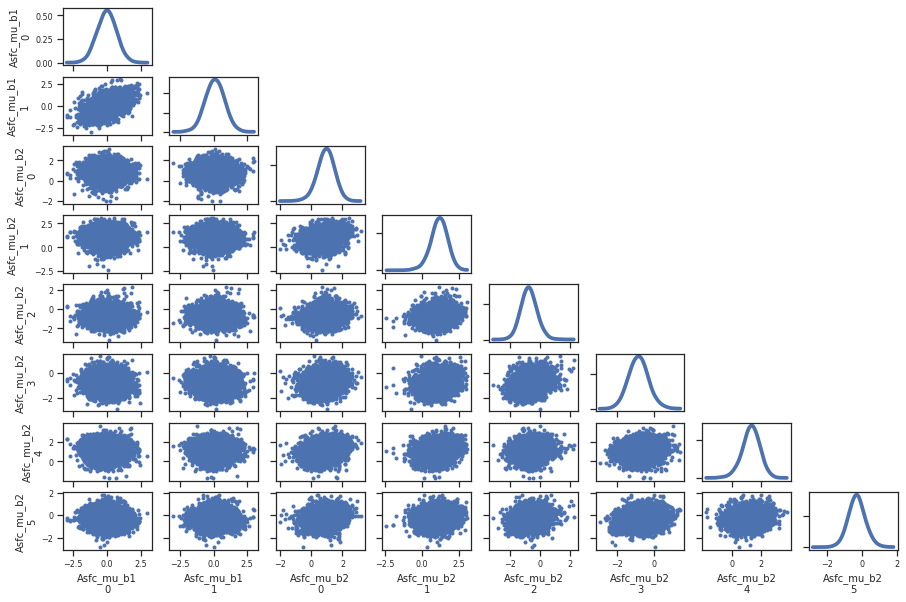

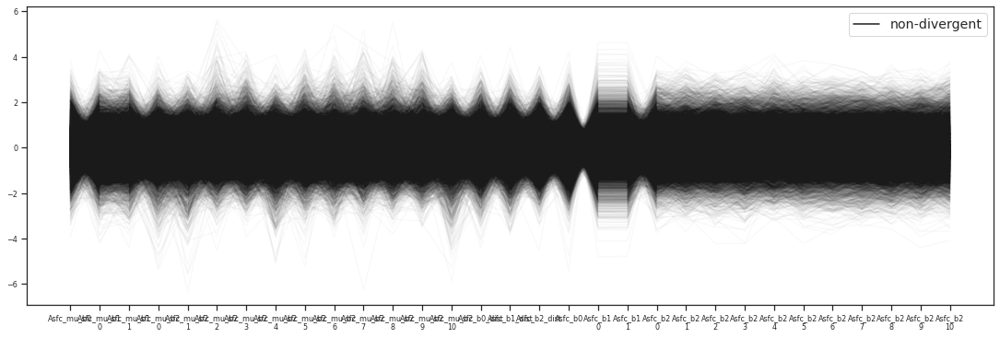

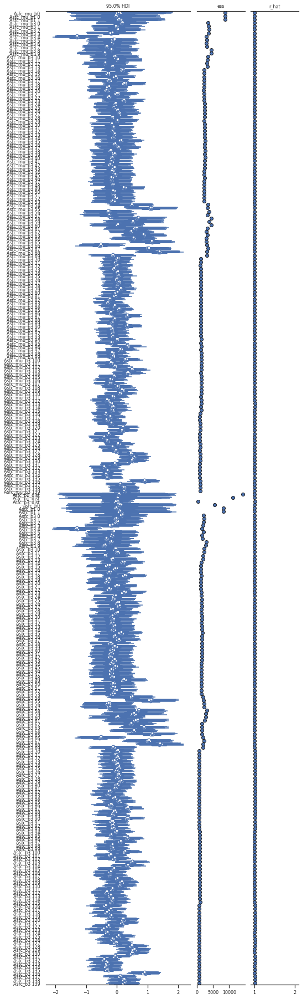

In [71]:
plotting_lib.plotDiagnostics(widthInch,heigthInch,dpi,writeOut,outPathPlots,trace_Asfc,dataTrace_Asfc,'Asfc')

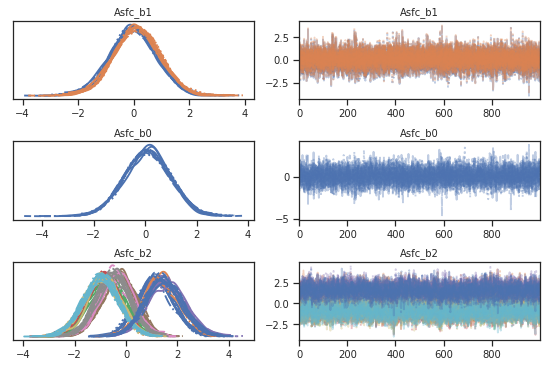

In [72]:
with AsfcModel as model:
    plotting_lib.plotTracesB(widthInch,heigthInch,dpi,writeOut,outPathPlots,trace_Asfc,'Asfc')

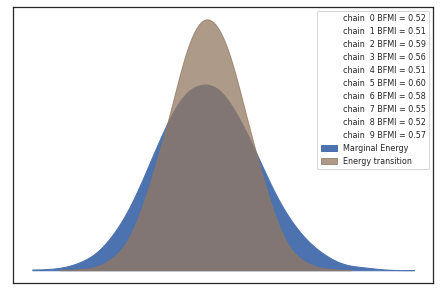

In [73]:
with AsfcModel as model:
    plotting_lib.pm.energyplot(trace_Asfc)

#### Posterior predictive distribution

In [74]:
with AsfcModel as model:
    posterior_pred_Asfc = pm.sample_posterior_predictive(trace_Asfc,samples=numPredSamples,random_seed=random_seed)

/home/bob/.local/lib/python3.8/site-packages/pymc3/sampling.py:1707: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


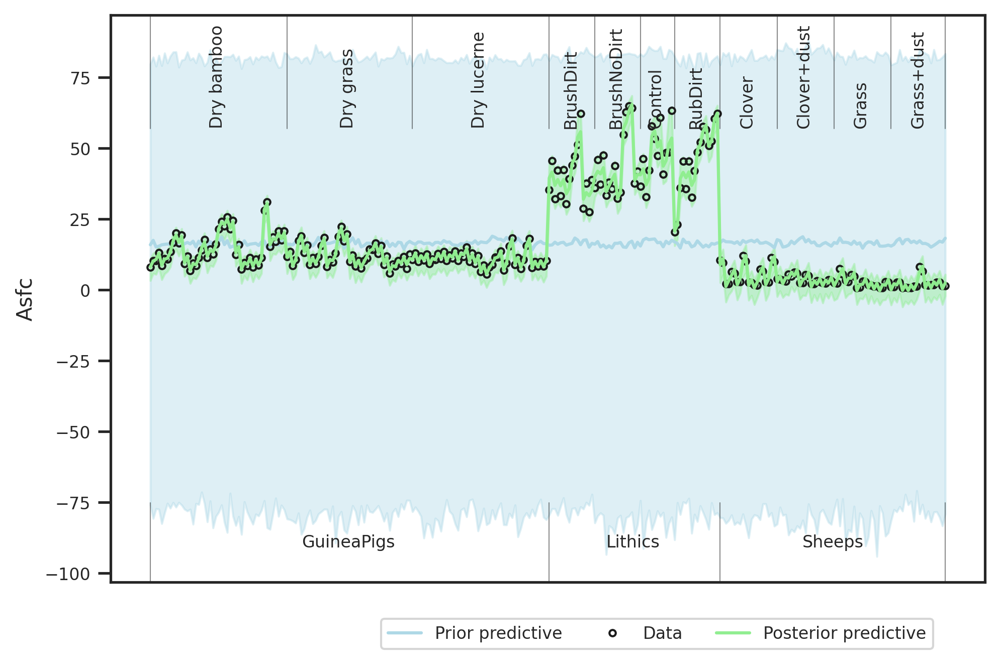

In [75]:
plotting_lib.plotPriorPosteriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,dictMeanStd,prior_pred_Asfc,posterior_pred_Asfc,dataZ["Asfc_z"].values,'Asfc')

#### Compare prior and posterior for model parameters

In [76]:
with AsfcModel as model:
    pm_data_Asfc = az.from_pymc3(trace=trace_Asfc,prior=prior_pred_Asfc,posterior_predictive=posterior_pred_Asfc)

arviz.data.io_pymc3 - WARNING - posterior predictive variable Asfc_y's shape not compatible with number of chains and draws. This can mean that some draws or even whole chains are not represented.


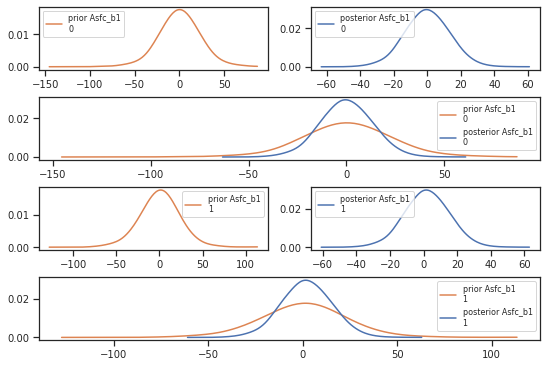

In [77]:
plotting_lib.plotPriorPosteriorB(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,pm_data_Asfc,'Asfc')

#### Posterior and contrasts

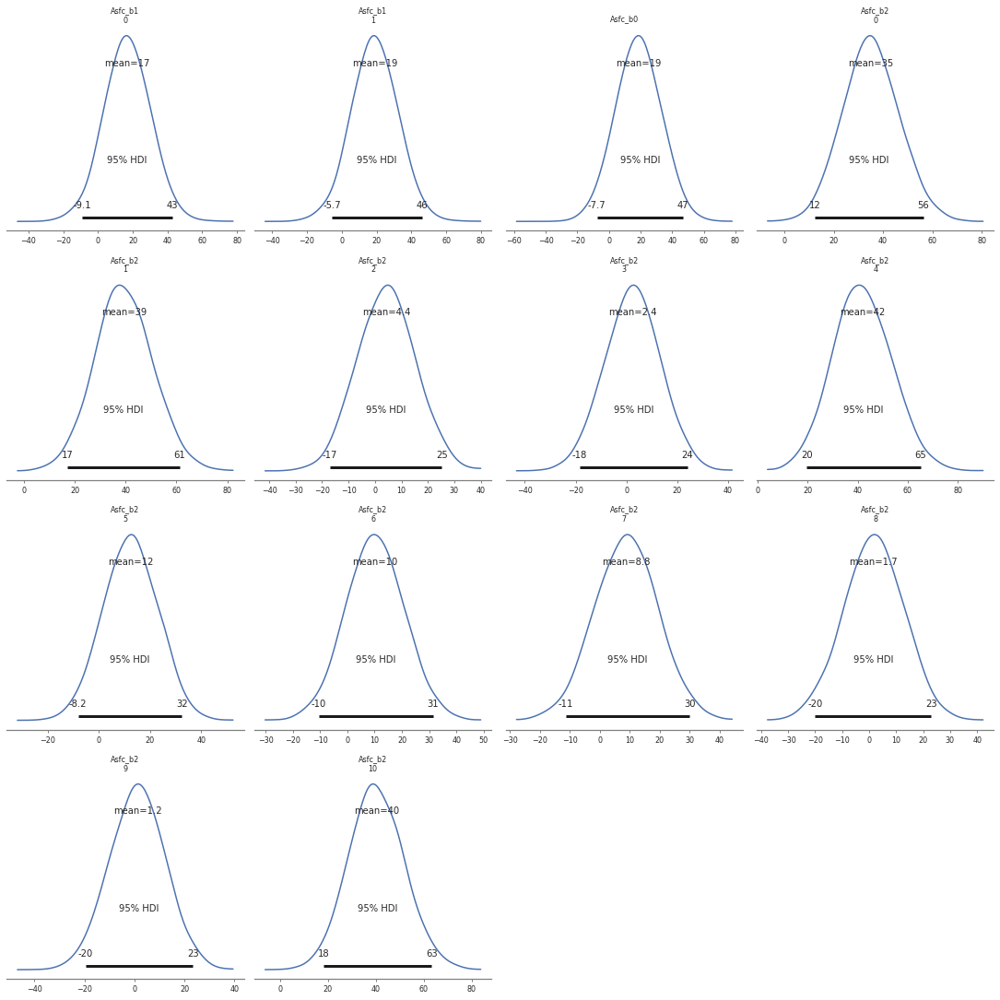

In [78]:
plotting_lib.plotPosterior(widthInch,heigthInch,dpi,writeOut,outPathPlots,dictMeanStd,pm_data_Asfc,'Asfc')

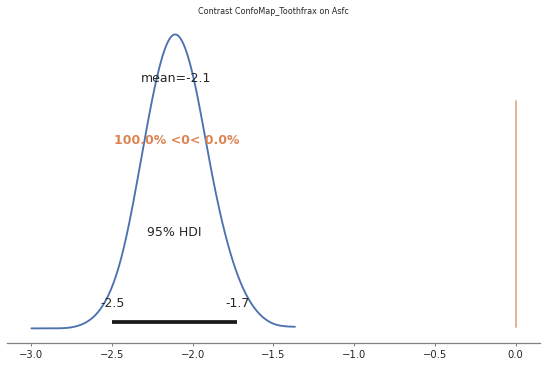

In [79]:
plotting_lib.plotContrast(widthInch,heigthInch,dpi,writeOut,outPathPlots,dictMeanStd,x1contrast_dict,trace_Asfc,'Asfc')

### 	Smfc  <a name="Smfc"></a>

In [80]:
with pm.Model() as model:
    SmfcModel = ThreeFactorModel('Smfc',x1,x2,x3,dataZ.Smfc_z.values)

#### Verify model settings

In [81]:
SmfcModel.printParams(x1,x2,x3,dataZ.Smfc_z.values)

The number of levels of the x variables are (2, 11, 140)
The standard deviations used for the beta priors are (1.190539275484547, 2.890262579386322, 5.950218540146849)


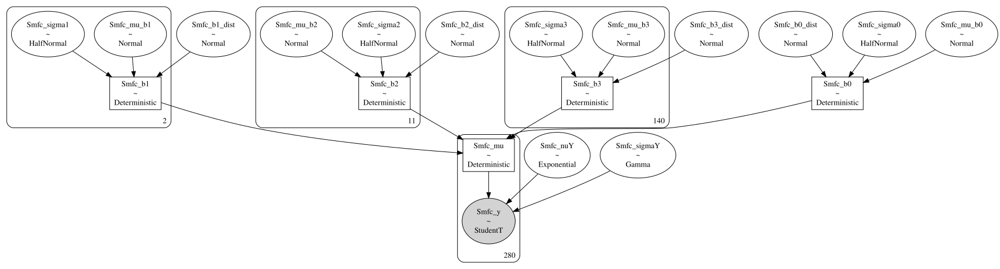

In [82]:
pm.model_to_graphviz(SmfcModel)

#### Check prior choice

In [83]:
with SmfcModel as model:
    prior_pred_Smfc = pm.sample_prior_predictive(samples=numPredSamples,random_seed=random_seed)

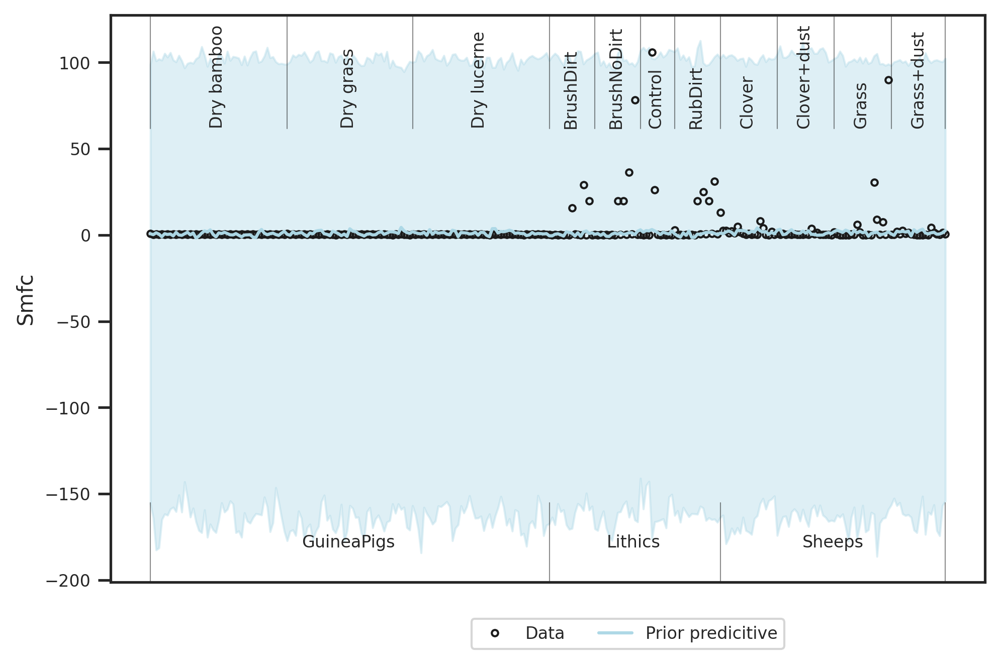

In [84]:
plotting_lib.plotPriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,dictMeanStd,prior_pred_Smfc,dataZ.Smfc_z.values,'Smfc')

Prior choice is as intended: Broad over the data range.

#### Sampling

In [85]:
with SmfcModel as model:
    trace_Smfc = pm.sample(numSamples,cores=numCores,tune=numTune,max_treedepth=20, init='auto',target_accept=0.8,random_seed=random_seed)
    #fit_Smfc = pm.fit(random_seed=random_seed)
    #trace_Smfc = fit_Smfc.sample(draws=numSamples)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 10 jobs)
NUTS: [Smfc_b3_dist, Smfc_b2_dist, Smfc_b1_dist, Smfc_b0_dist, Smfc_sigmaY, Smfc_nuY, Smfc_mu_b3, Smfc_mu_b2, Smfc_mu_b1, Smfc_mu_b0, Smfc_sigma3, Smfc_sigma2, Smfc_sigma1, Smfc_sigma0]


Sampling 10 chains for 1_000 tune and 1_000 draw iterations (10_000 + 10_000 draws total) took 9091 seconds.
There were 264 divergences after tuning. Increase `target_accept` or reparameterize.
There were 182 divergences after tuning. Increase `target_accept` or reparameterize.
There were 124 divergences after tuning. Increase `target_accept` or reparameterize.
There were 160 divergences after tuning. Increase `target_accept` or reparameterize.
There were 742 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.3985393735661282, but should be close to 0.8. Try to increase the number of tuning steps.
There were 211 divergences after tuning. Increase `target_accept` or reparameterize.
There were 68 divergences after tuning. Increase `target_accept` or reparameterize.
There were 154 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 

Analysis stopped here because sampling did not converge.
As the plot shows, some data points are very far away from the others, which would require the analysis to be based on more heavy-tailed distributions.

### HAsfc9 <a name="HAsfc9"></a>

In [86]:
with pm.Model() as model:
    HAsfc9Model = ThreeFactorModel('HAsfc9',x1,x2,x3,dataZ["HAsfc9_z"].values)

#### Verify model settings

In [87]:
HAsfc9Model.printParams(x1,x2,x3,dataZ["HAsfc9_z"].values)

The number of levels of the x variables are (2, 11, 140)
The standard deviations used for the beta priors are (1.0540496136136044, 2.005676747692769, 1.9447674898721503)


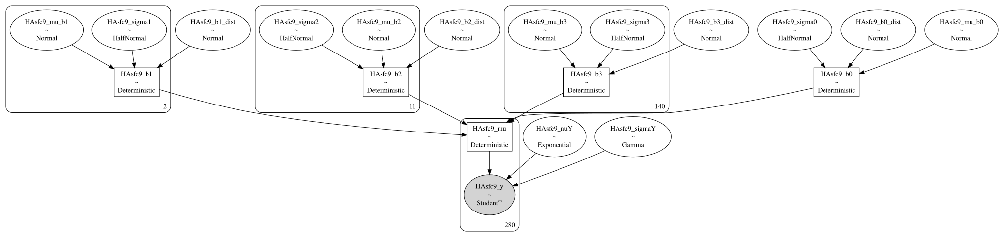

In [88]:
pm.model_to_graphviz(HAsfc9Model)

#### Check prior choice

In [89]:
with HAsfc9Model as model:
    prior_pred_HAsfc9 = pm.sample_prior_predictive(samples=numPredSamples,random_seed=random_seed)

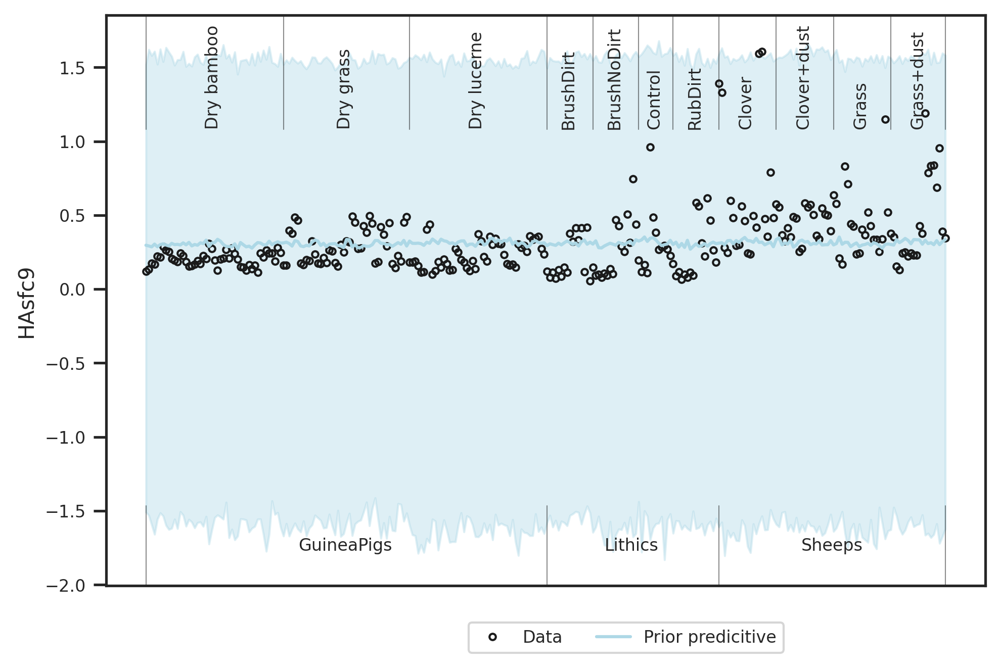

In [90]:
plotting_lib.plotPriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,dictMeanStd,prior_pred_HAsfc9,dataZ["HAsfc9_z"].values,'HAsfc9')

Prior choice is as intended: Broad over the data range.

#### Sampling

In [92]:
with HAsfc9Model as model:
    trace_HAsfc9 = pm.sample(numSamples,cores=numCores,tune=numTune,max_treedepth=20, init='auto',target_accept=target_accept,random_seed=random_seed)
    #fit_HAsfc9 = pm.fit(random_seed=random_seed)
    #trace_HAsfc9 = fit_HAsfc9.sample(draws=numSamples)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 10 jobs)
NUTS: [HAsfc9_b3_dist, HAsfc9_b2_dist, HAsfc9_b1_dist, HAsfc9_b0_dist, HAsfc9_sigmaY, HAsfc9_nuY, HAsfc9_mu_b3, HAsfc9_mu_b2, HAsfc9_mu_b1, HAsfc9_mu_b0, HAsfc9_sigma3, HAsfc9_sigma2, HAsfc9_sigma1, HAsfc9_sigma0]


Sampling 10 chains for 1_000 tune and 1_000 draw iterations (10_000 + 10_000 draws total) took 2488 seconds.
The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


In [93]:
with HAsfc9Model as model:
    if writeOut:
        with open(outPathData + 'model_{}.pkl'.format('HAsfc9'), 'wb') as buff:
            pickle.dump({'model': HAsfc9Model, 'trace': trace_HAsfc9}, buff)

#### Check sampling

In [94]:
with HAsfc9Model as model:
    dataTrace_HAsfc9 = az.from_pymc3(trace=trace_HAsfc9)

In [95]:
pm.summary(dataTrace_HAsfc9,hdi_prob=0.95).round(2)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
HAsfc9_mu_b0,0.02,0.81,-1.57,1.60,0.01,0.01,9256.0,6269.0,9260.0,7822.0,1.00
HAsfc9_mu_b1[0],0.06,0.69,-1.29,1.42,0.01,0.01,9596.0,6147.0,9589.0,7595.0,1.00
HAsfc9_mu_b1[1],-0.05,0.70,-1.44,1.29,0.01,0.01,10666.0,5860.0,10642.0,7766.0,1.00
HAsfc9_mu_b2[0],-0.44,0.53,-1.47,0.62,0.01,0.01,4598.0,4598.0,4586.0,6293.0,1.00
HAsfc9_mu_b2[1],-0.26,0.53,-1.28,0.80,0.01,0.01,4238.0,4238.0,4219.0,6258.0,1.00
...,...,...,...,...,...,...,...,...,...,...,...
HAsfc9_mu[275],2.17,0.08,2.02,2.33,0.00,0.00,10260.0,10260.0,10106.0,7282.0,1.00
HAsfc9_mu[276],1.77,0.42,1.41,2.96,0.02,0.01,720.0,665.0,1653.0,1250.0,1.01
HAsfc9_mu[277],1.64,0.42,1.26,2.82,0.02,0.01,722.0,664.0,1691.0,1345.0,1.01
HAsfc9_mu[278],0.28,0.06,0.17,0.40,0.00,0.00,10374.0,9833.0,10289.0,8135.0,1.00


/home/bob/.local/lib/python3.8/site-packages/arviz/plots/backends/matplotlib/pairplot.py:212: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  warnings.warn(


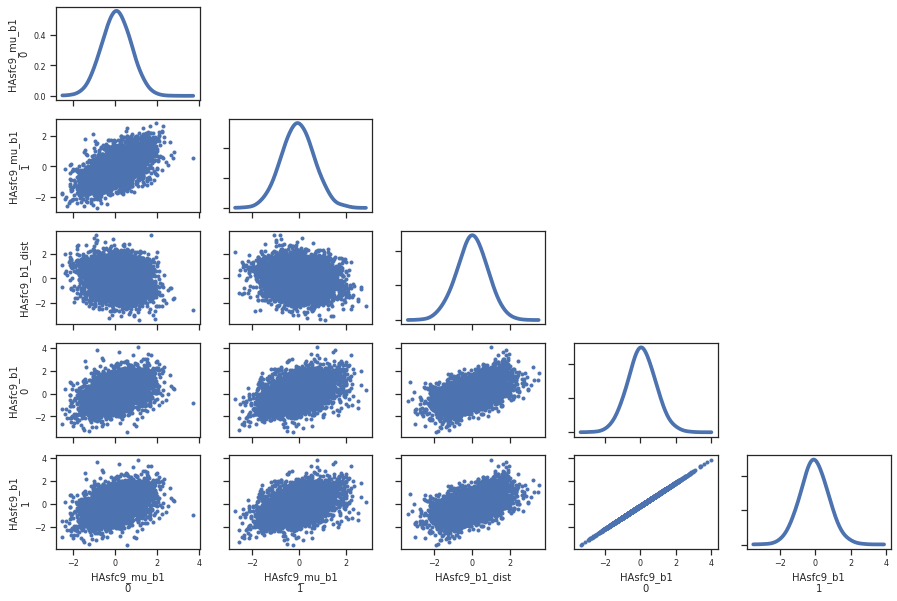

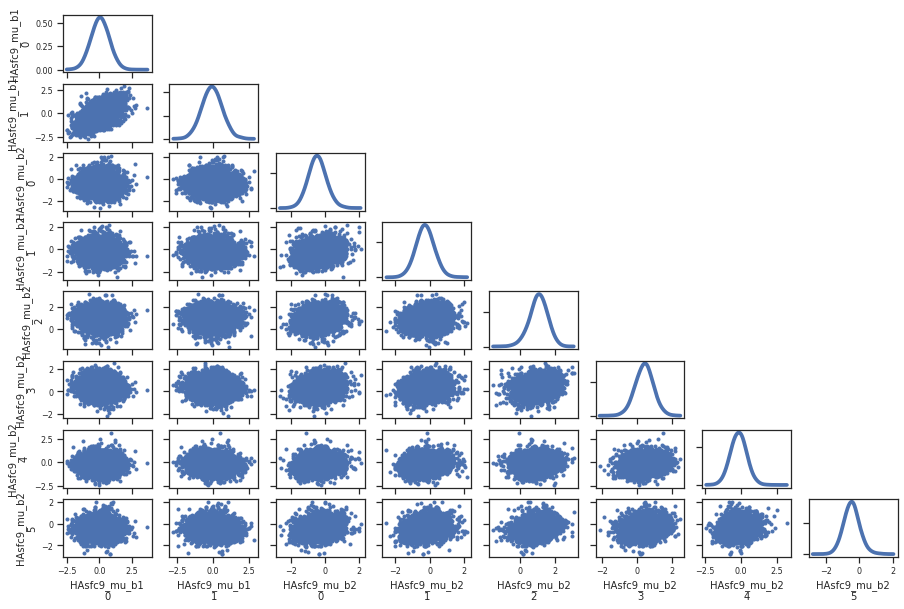

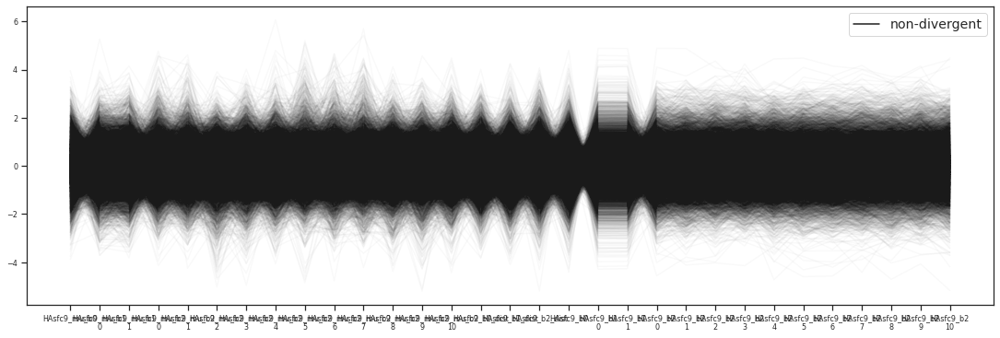

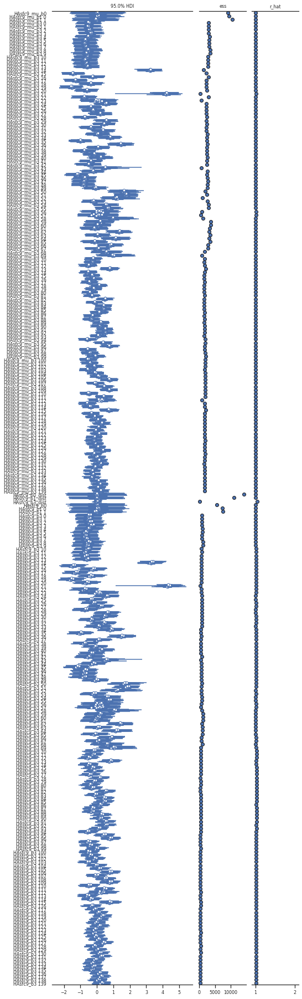

In [96]:
plotting_lib.plotDiagnostics(widthInch,heigthInch,dpi,writeOut,outPathPlots,trace_HAsfc9,dataTrace_HAsfc9,'HAsfc9')

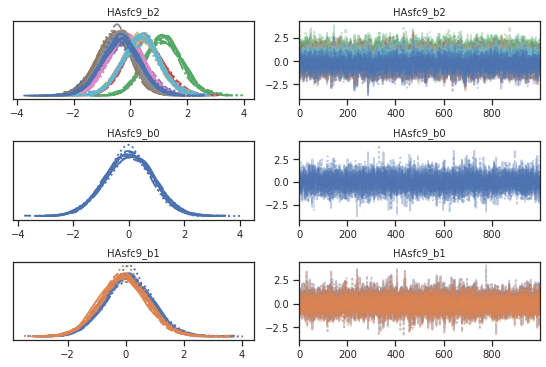

In [97]:
with HAsfc9Model as model:
    plotting_lib.plotTracesB(widthInch,heigthInch,dpi,writeOut,outPathPlots,trace_HAsfc9,'HAsfc9')

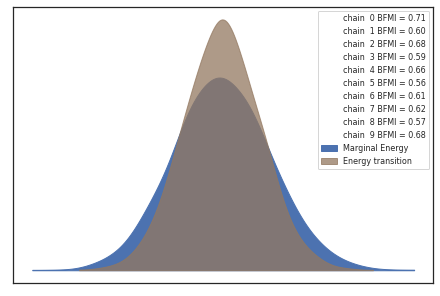

In [98]:
with HAsfc9Model as model:
    plotting_lib.pm.energyplot(trace_HAsfc9)

#### Posterior predictive distribution

In [99]:
with HAsfc9Model as model:
    posterior_pred_HAsfc9 = pm.sample_posterior_predictive(trace_HAsfc9,samples=numPredSamples,random_seed=random_seed)

/home/bob/.local/lib/python3.8/site-packages/pymc3/sampling.py:1707: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


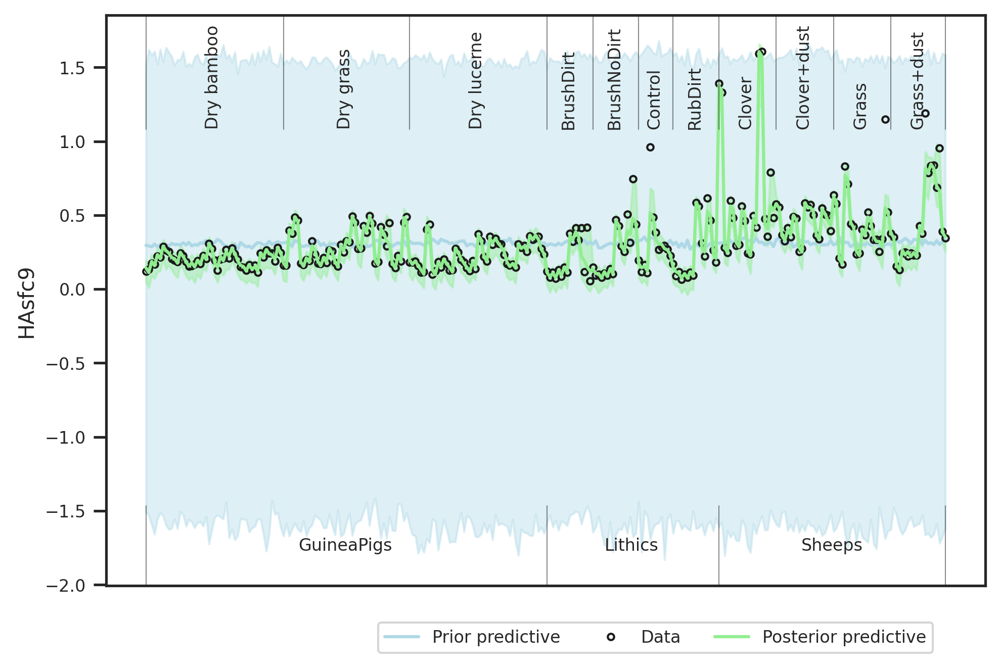

In [100]:
plotting_lib.plotPriorPosteriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,dictMeanStd,prior_pred_HAsfc9,posterior_pred_HAsfc9,dataZ["HAsfc9_z"].values,'HAsfc9')

#### Compare prior and posterior for model parameters

In [101]:
with HAsfc9Model as model:
    pm_data_HAsfc9 = az.from_pymc3(trace=trace_HAsfc9,prior=prior_pred_HAsfc9,posterior_predictive=posterior_pred_HAsfc9)

arviz.data.io_pymc3 - WARNING - posterior predictive variable HAsfc9_y's shape not compatible with number of chains and draws. This can mean that some draws or even whole chains are not represented.


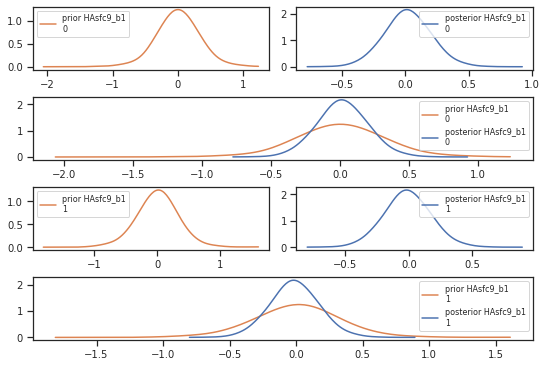

In [102]:
plotting_lib.plotPriorPosteriorB(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,pm_data_HAsfc9,'HAsfc9')

#### Posterior and contrasts

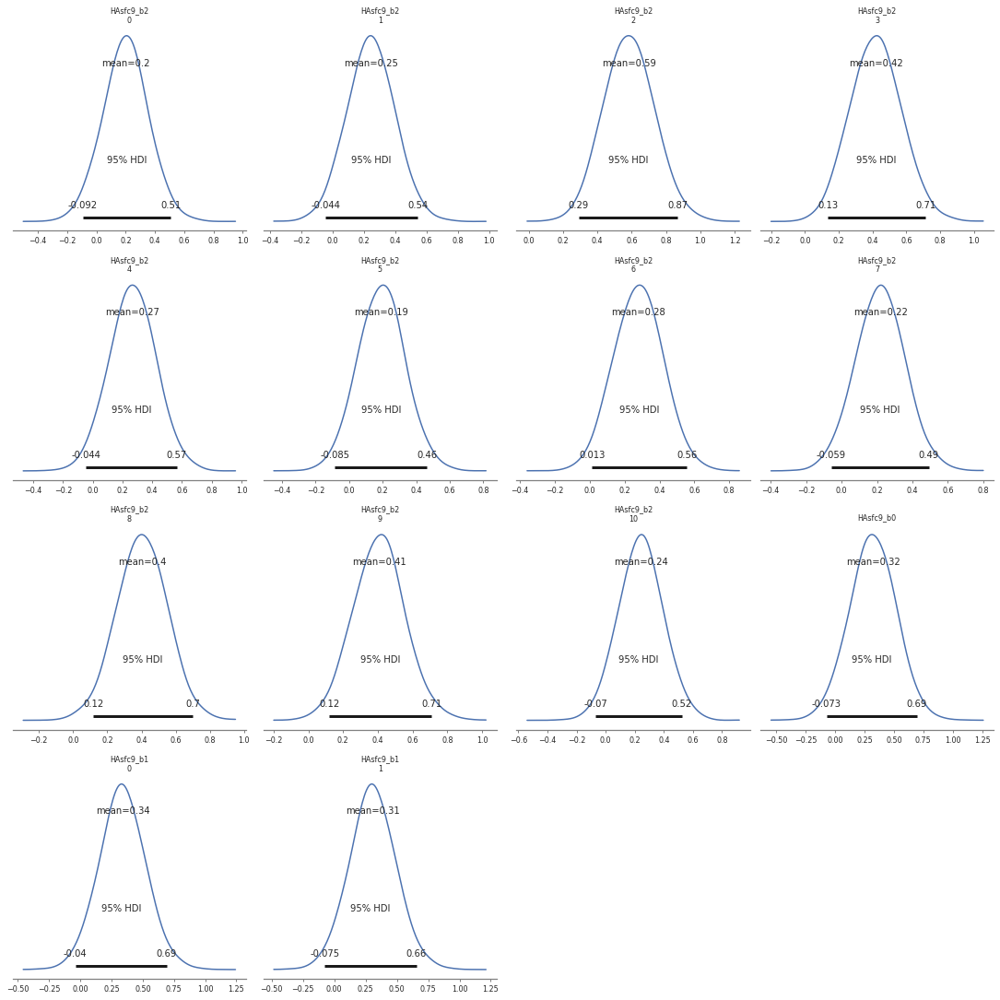

In [103]:
plotting_lib.plotPosterior(widthInch,heigthInch,dpi,writeOut,outPathPlots,dictMeanStd,pm_data_HAsfc9,'HAsfc9')

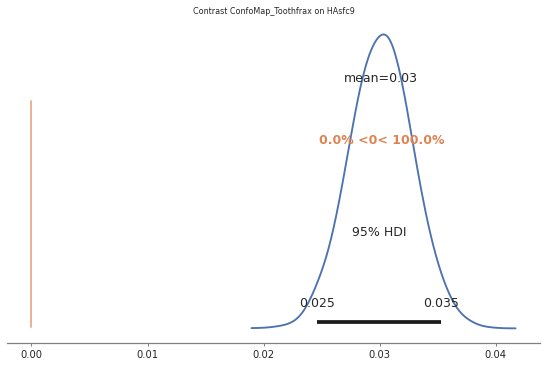

In [104]:
plotting_lib.plotContrast(widthInch,heigthInch,dpi,writeOut,outPathPlots,dictMeanStd,x1contrast_dict,trace_HAsfc9,'HAsfc9')

### HAsfc81 <a name="HAsfc81"></a>

In [105]:
with pm.Model() as model:
    HAsfc81Model = ThreeFactorModel('HAsfc81',x1,x2,x3,dataZ["HAsfc81_z"].values)

#### Verify model settings

In [106]:
HAsfc81Model.printParams(x1,x2,x3,dataZ["HAsfc81_z"].values)

The number of levels of the x variables are (2, 11, 140)
The standard deviations used for the beta priors are (1.0444803217312628, 1.586983908089902, 1.3271002181181868)


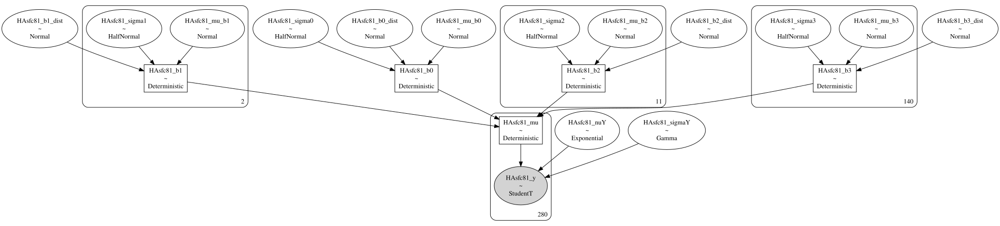

In [107]:
pm.model_to_graphviz(HAsfc81Model)

#### Check prior choice

In [108]:
with HAsfc81Model as model:
    prior_pred_HAsfc81 = pm.sample_prior_predictive(samples=numPredSamples,random_seed=random_seed)

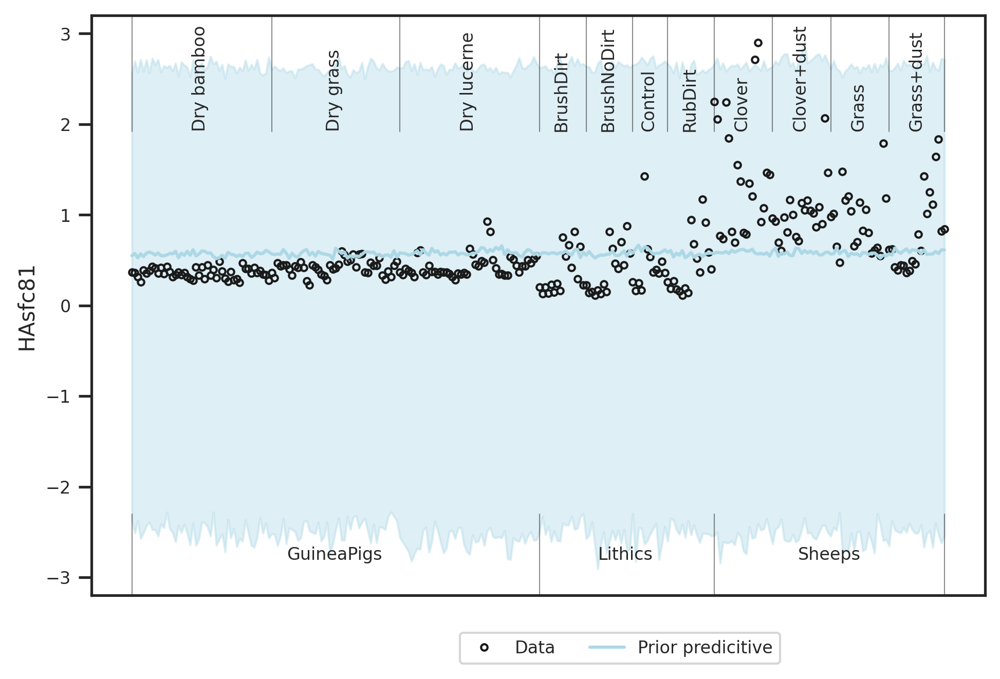

In [109]:
plotting_lib.plotPriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,dictMeanStd,prior_pred_HAsfc81,dataZ["HAsfc81_z"].values,'HAsfc81')

Prior choice is as intended: Broad over the data range.

#### Sampling

In [110]:
with HAsfc81Model as model:
    trace_HAsfc81 = pm.sample(numSamples,cores=numCores,tune=numTune,max_treedepth=20, init='auto',target_accept=target_accept,random_seed=random_seed)
    #fit_HAsfc81 = pm.fit(random_seed=random_seed)
    #trace_HAsfc81 = fit_HAsfc81.sample(draws=numSamples)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 10 jobs)
NUTS: [HAsfc81_b3_dist, HAsfc81_b2_dist, HAsfc81_b1_dist, HAsfc81_b0_dist, HAsfc81_sigmaY, HAsfc81_nuY, HAsfc81_mu_b3, HAsfc81_mu_b2, HAsfc81_mu_b1, HAsfc81_mu_b0, HAsfc81_sigma3, HAsfc81_sigma2, HAsfc81_sigma1, HAsfc81_sigma0]


Sampling 10 chains for 1_000 tune and 1_000 draw iterations (10_000 + 10_000 draws total) took 2793 seconds.
The number of effective samples is smaller than 10% for some parameters.


In [111]:
with HAsfc81Model as model:
    if writeOut:
        with open(outPathData + 'model_{}.pkl'.format('HAsfc81'), 'wb') as buff:
            pickle.dump({'model': HAsfc81Model, 'trace': trace_HAsfc81}, buff)

#### Check sampling

In [112]:
with HAsfc81Model as model:
    dataTrace_HAsfc81 = az.from_pymc3(trace=trace_HAsfc81)

In [113]:
pm.summary(dataTrace_HAsfc81,hdi_prob=0.95).round(2)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
HAsfc81_mu_b0,0.02,0.82,-1.61,1.61,0.01,0.01,9904.0,5333.0,9905.0,7858.0,1.0
HAsfc81_mu_b1[0],0.08,0.70,-1.24,1.47,0.01,0.01,10595.0,5672.0,10574.0,7773.0,1.0
HAsfc81_mu_b1[1],-0.04,0.70,-1.42,1.33,0.01,0.01,10887.0,5476.0,10904.0,7653.0,1.0
HAsfc81_mu_b2[0],-0.49,0.54,-1.53,0.60,0.01,0.00,5378.0,5378.0,5358.0,6343.0,1.0
HAsfc81_mu_b2[1],-0.44,0.54,-1.50,0.65,0.01,0.00,5367.0,5367.0,5348.0,6651.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
HAsfc81_mu[275],1.31,0.10,1.12,1.50,0.00,0.00,9863.0,9863.0,9664.0,7128.0,1.0
HAsfc81_mu[276],2.59,0.25,2.28,3.10,0.00,0.00,3424.0,3257.0,4346.0,6605.0,1.0
HAsfc81_mu[277],2.47,0.25,2.17,2.98,0.00,0.00,3406.0,3227.0,4273.0,6371.0,1.0
HAsfc81_mu[278],0.62,0.09,0.46,0.79,0.00,0.00,10539.0,10159.0,10427.0,8048.0,1.0


/home/bob/.local/lib/python3.8/site-packages/arviz/plots/backends/matplotlib/pairplot.py:212: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  warnings.warn(


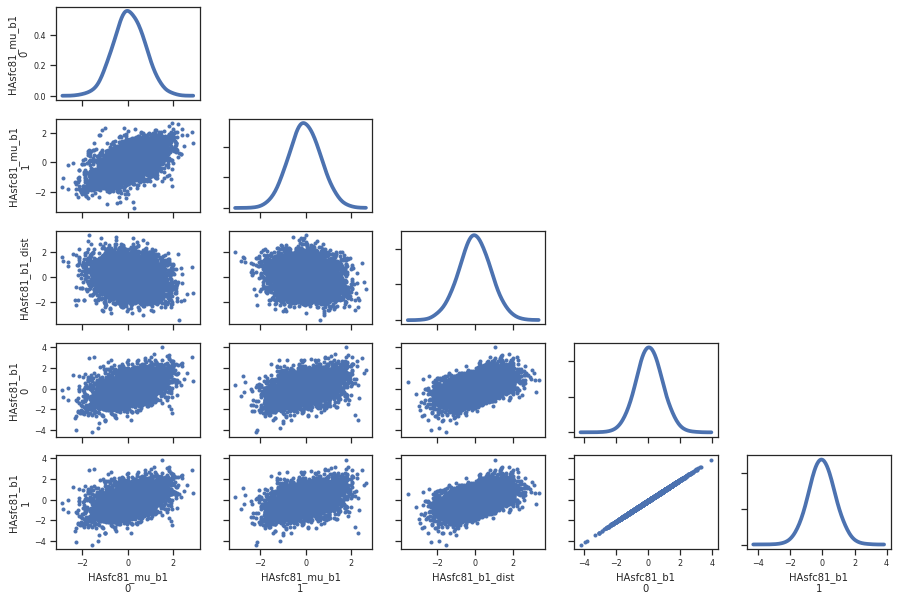

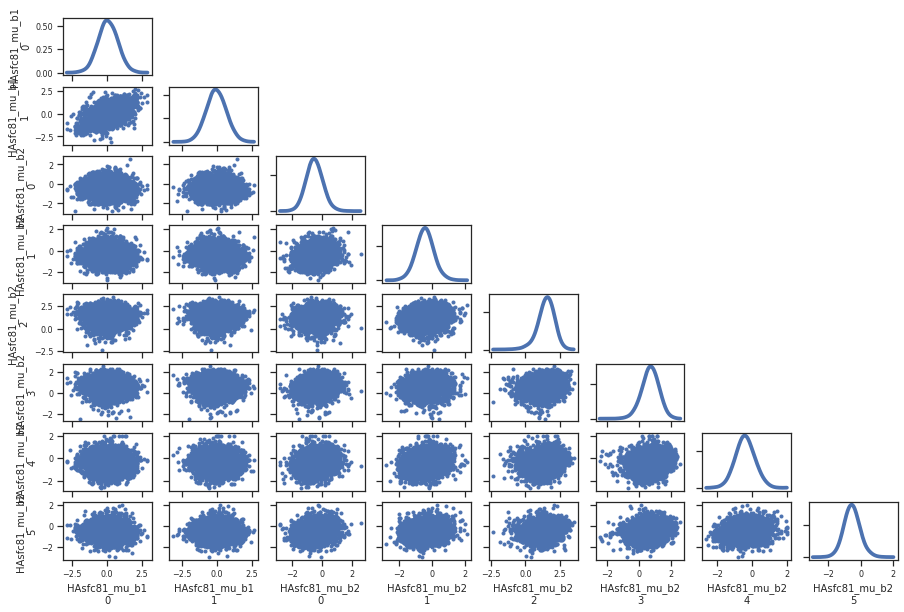

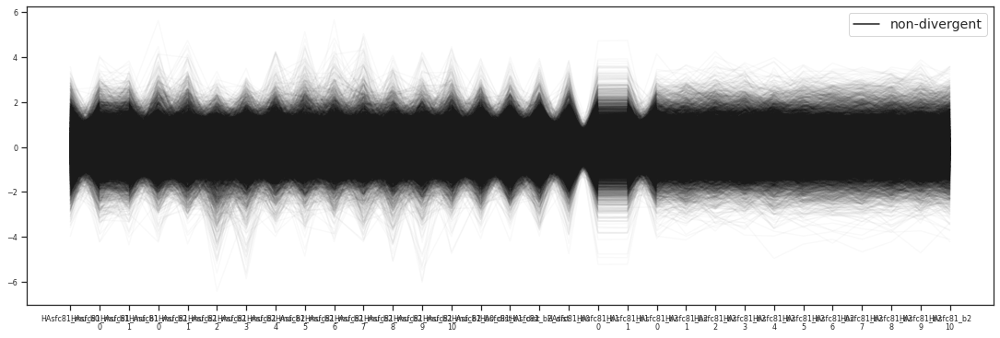

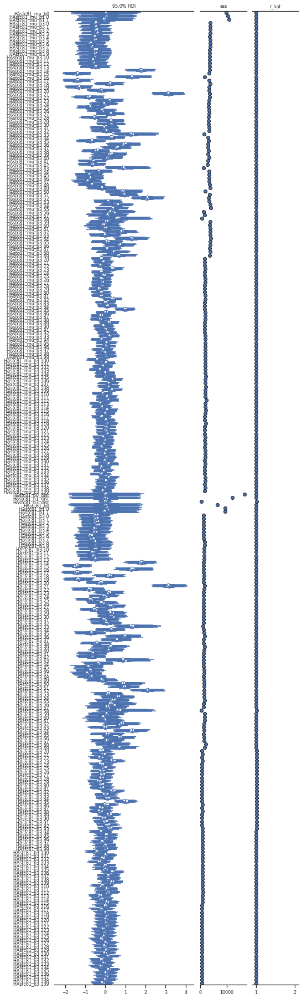

In [114]:
plotting_lib.plotDiagnostics(widthInch,heigthInch,dpi,writeOut,outPathPlots,trace_HAsfc81,dataTrace_HAsfc81,'HAsfc81')

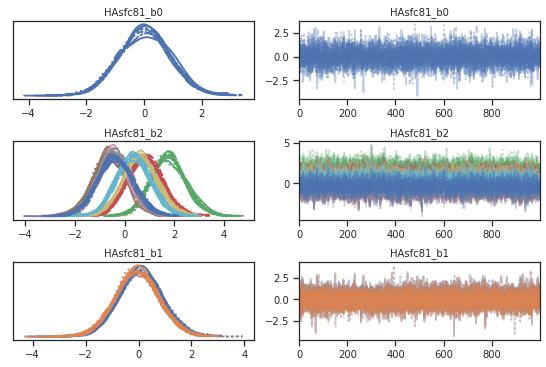

In [115]:
with HAsfc81Model as model:
    plotting_lib.plotTracesB(widthInch,heigthInch,dpi,writeOut,outPathPlots,trace_HAsfc81,'HAsfc81')

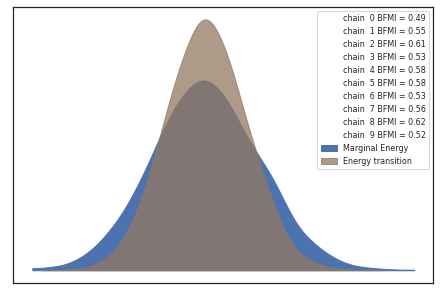

In [116]:
with HAsfc81Model as model:
    plotting_lib.pm.energyplot(trace_HAsfc81)

#### Posterior predictive distribution

In [117]:
with HAsfc81Model as model:
    posterior_pred_HAsfc81 = pm.sample_posterior_predictive(trace_HAsfc81,samples=numPredSamples,random_seed=random_seed)

/home/bob/.local/lib/python3.8/site-packages/pymc3/sampling.py:1707: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


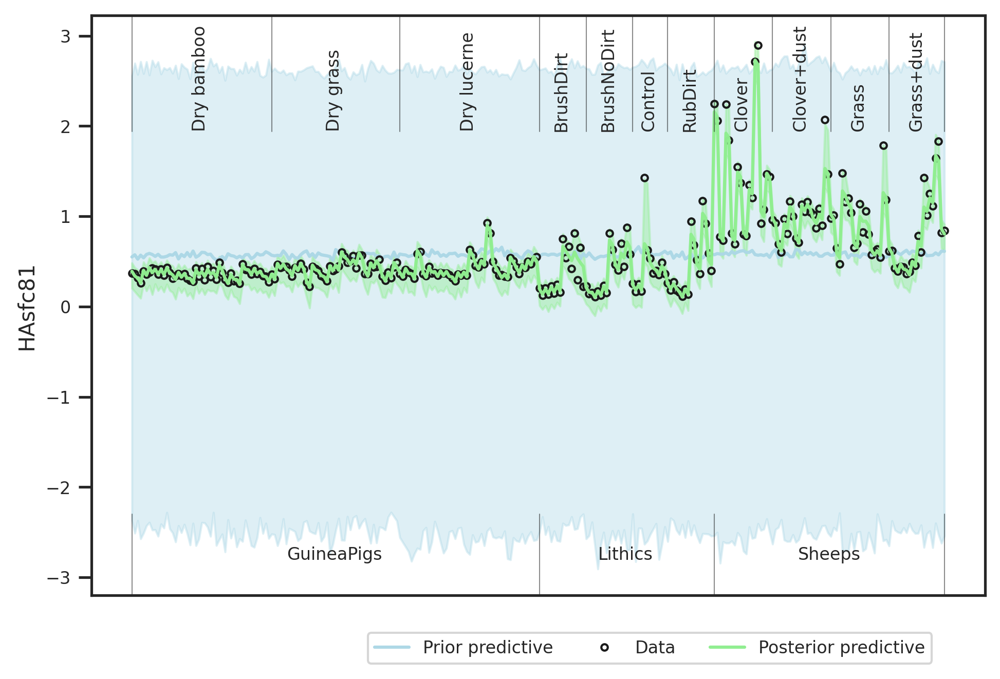

In [118]:
plotting_lib.plotPriorPosteriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,dictMeanStd,prior_pred_HAsfc81,posterior_pred_HAsfc81,dataZ["HAsfc81_z"].values,'HAsfc81')

#### Compare prior and posterior for model parameters

In [119]:
with HAsfc81Model as model:
    pm_data_HAsfc81 = az.from_pymc3(trace=trace_HAsfc81,prior=prior_pred_HAsfc81,posterior_predictive=posterior_pred_HAsfc81)

arviz.data.io_pymc3 - WARNING - posterior predictive variable HAsfc81_y's shape not compatible with number of chains and draws. This can mean that some draws or even whole chains are not represented.


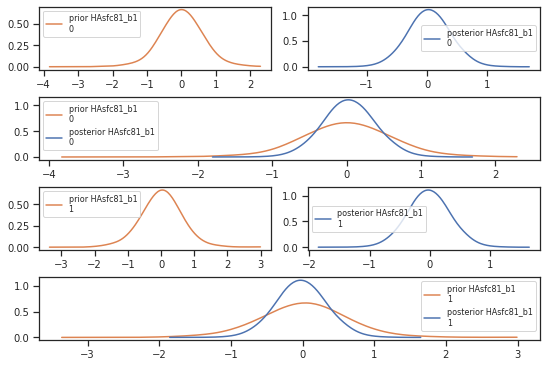

In [120]:
plotting_lib.plotPriorPosteriorB(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,pm_data_HAsfc81,'HAsfc81')

#### Posterior and contrasts

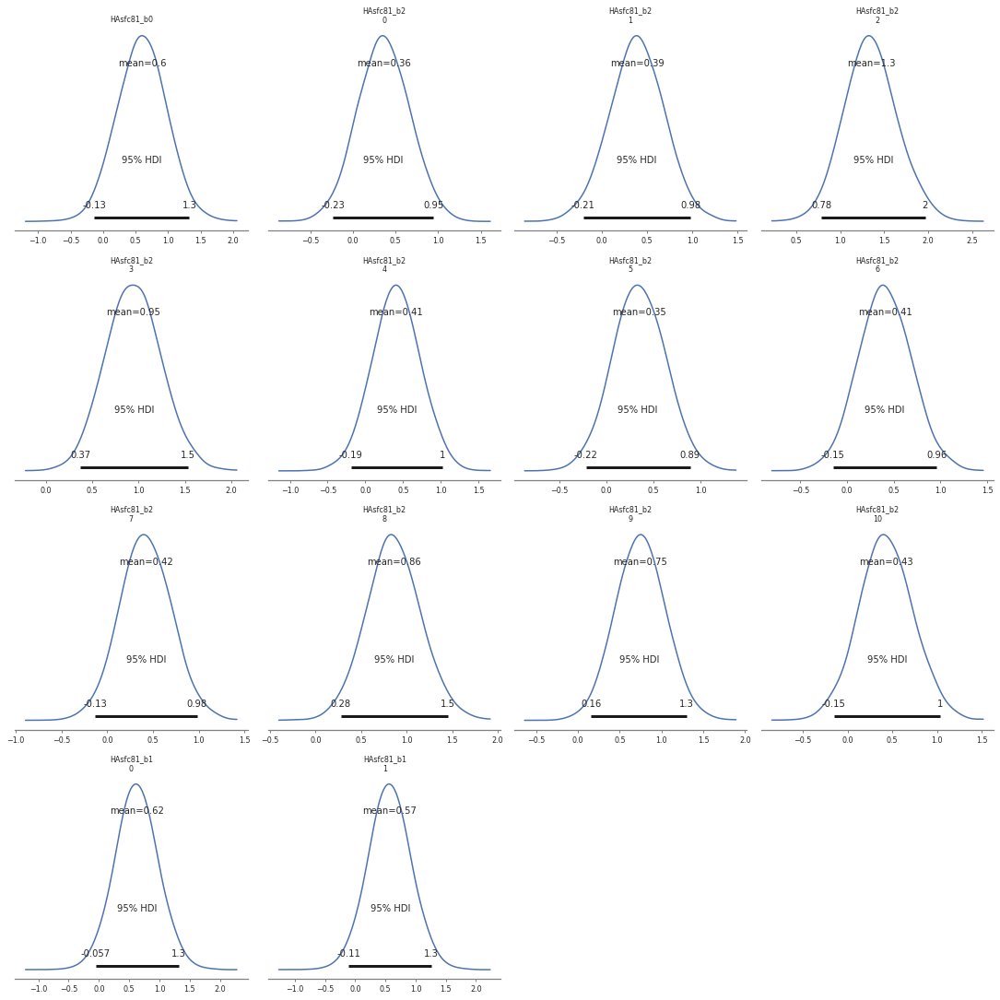

In [121]:
plotting_lib.plotPosterior(widthInch,heigthInch,dpi,writeOut,outPathPlots,dictMeanStd,pm_data_HAsfc81,'HAsfc81')

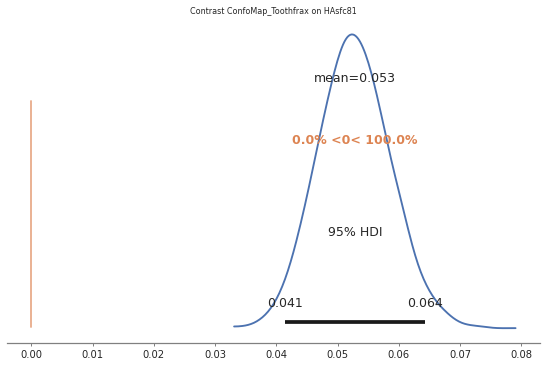

In [122]:
plotting_lib.plotContrast(widthInch,heigthInch,dpi,writeOut,outPathPlots,dictMeanStd,x1contrast_dict,trace_HAsfc81,'HAsfc81')

## Summary <a name="summary"></a>
The contrast plots between the two software packages are shown below again for each variable except Smfc

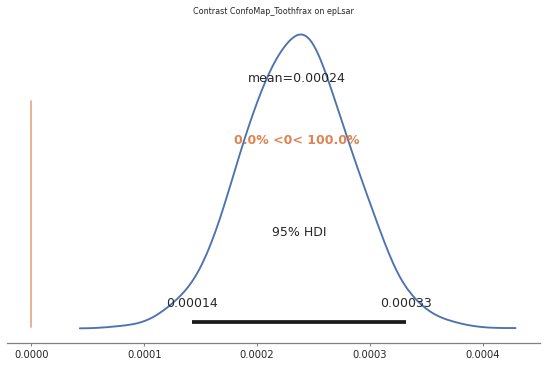

In [123]:
plotting_lib.plotContrast(widthInch,heigthInch,dpi,writeOut,outPathPlots,dictMeanStd,x1contrast_dict,trace_epLsar,'epLsar')

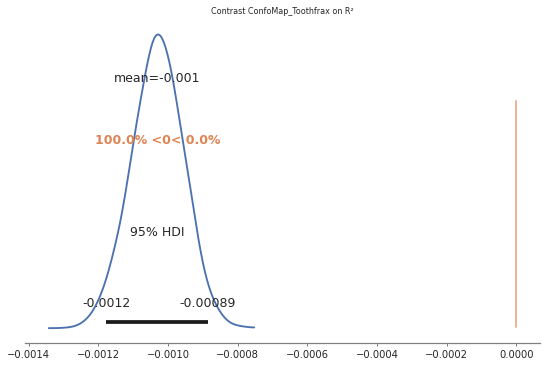

In [124]:
plotting_lib.plotContrast(widthInch,heigthInch,dpi,writeOut,outPathPlots,dictMeanStd,x1contrast_dict,trace_Rsquared,'R²')

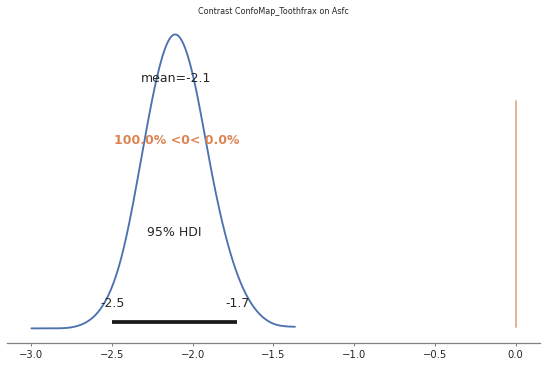

In [125]:
plotting_lib.plotContrast(widthInch,heigthInch,dpi,writeOut,outPathPlots,dictMeanStd,x1contrast_dict,trace_Asfc,'Asfc')

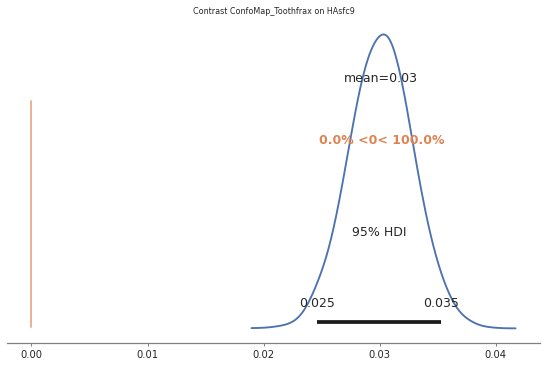

In [126]:
plotting_lib.plotContrast(widthInch,heigthInch,dpi,writeOut,outPathPlots,dictMeanStd,x1contrast_dict,trace_HAsfc9,'HAsfc9')

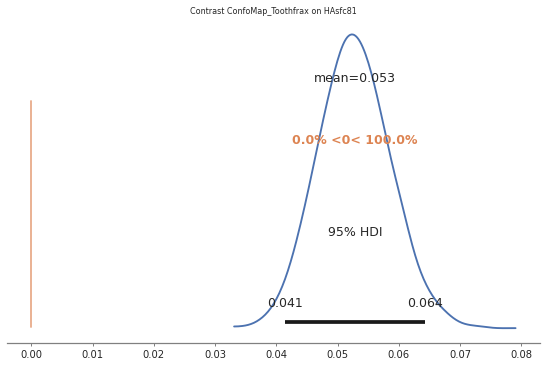

In [127]:
plotting_lib.plotContrast(widthInch,heigthInch,dpi,writeOut,outPathPlots,dictMeanStd,x1contrast_dict,trace_HAsfc81,'HAsfc81')

### Write out

In [128]:
!jupyter nbconvert --to html Statistical_Model_ThreeFactor.ipynb

[NbConvertApp] Converting notebook Statistical_Model_ThreeFactor.ipynb to html
[NbConvertApp] Writing 9690517 bytes to Statistical_Model_ThreeFactor.html


In [129]:
!jupyter nbconvert --to markdown Statistical_Model_ThreeFactor.ipynb

[NbConvertApp] Converting notebook Statistical_Model_ThreeFactor.ipynb to markdown
[NbConvertApp] Support files will be in Statistical_Model_ThreeFactor_files/
[NbConvertApp] Making directory Statistical_Model_ThreeFactor_files
[NbConvertApp] Making directory Statistical_Model_ThreeFactor_files
[NbConvertApp] Making directory Statistical_Model_ThreeFactor_files
[NbConvertApp] Making directory Statistical_Model_ThreeFactor_files
[NbConvertApp] Making directory Statistical_Model_ThreeFactor_files
[NbConvertApp] Making directory Statistical_Model_ThreeFactor_files
[NbConvertApp] Making directory Statistical_Model_ThreeFactor_files
[NbConvertApp] Making directory Statistical_Model_ThreeFactor_files
[NbConvertApp] Making directory Statistical_Model_ThreeFactor_files
[NbConvertApp] Making directory Statistical_Model_ThreeFactor_files
[NbConvertApp] Making directory Statistical_Model_ThreeFactor_files
[NbConvertApp] Making directory Statistical_Model_ThreeFactor_files
[NbConvertApp] Making di